In [3]:
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
import seaborn as sns

import visual_funcs as vf
from sklearn.model_selection import train_test_split

Спрогнозируйте вероятность того, что кандидат будет работать на компанию


**Атрибуты**:

- enrolle_id - Уникальный идентификатор кандидата
- city - Код города
- city_ development _index - Индекс развития города (масштабированный)
- gender - пол кандидата
- relevent_experience - релевантный опыт кандидата
- enrolled_university - тип обучения в университете (если был)
- education_level - уровень образования кандидата
- major_discipline - основная специальность по образованию
- experience - общий стаж кандидата в годах
- company_size - размер компании в работниках
- company_type - тип работодателя
- lastnewjob - дельта в годах между предыдущей и текущей работах
- training_hours - кол-во завершенных часов обучения
- target 0 – Не ищу новую работу
- target 1 – Ищу новую работу

**Установите с самом начале (в качестве random_state) RAND=10**

In [4]:
RAND = 10
N_FOLDS = 5

# Import data

1) Прочитать файл aug_train.csv и записать в переменную df

In [5]:
df = pd.read_csv('aug_train.csv')

# EDA

In [6]:
df[:5]

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.0
2,11561,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,never,83,0.0
3,33241,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,never,52,1.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.0


2) Замените в значениях признаках last_new_job, experience и company_size:
    
- символ '>' на 'more_'
- символ '<' на 'less_'

In [7]:
df.replace(r'>\b', 'more_', regex=True, inplace=True)
df.replace(r'<\b', 'less_', regex=True, inplace=True)

df[:5]

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,more_20,NaN,NaN,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,more_4,47,0.0
2,11561,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,never,83,0.0
3,33241,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,less_1,NaN,Pvt Ltd,never,52,1.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,more_20,50-99,Funded Startup,4,8,0.0


3) Вывести общую информацию о датасете при помощи метода info(), а также основные описательные статистики для числовых и категориальных признаков

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   enrollee_id             19158 non-null  int64  
 1   city                    19158 non-null  object 
 2   city_development_index  19158 non-null  float64
 3   gender                  14650 non-null  object 
 4   relevent_experience     19158 non-null  object 
 5   enrolled_university     18772 non-null  object 
 6   education_level         18698 non-null  object 
 7   major_discipline        16345 non-null  object 
 8   experience              19093 non-null  object 
 9   company_size            13220 non-null  object 
 10  company_type            13018 non-null  object 
 11  last_new_job            18735 non-null  object 
 12  training_hours          19158 non-null  int64  
 13  target                  19158 non-null  float64
dtypes: float64(2), int64(2), object(10)
me

In [9]:
df.isna().sum()/df.shape[0] * 100

enrollee_id                0.000000
city                       0.000000
city_development_index     0.000000
gender                    23.530640
relevent_experience        0.000000
enrolled_university        2.014824
education_level            2.401086
major_discipline          14.683161
experience                 0.339284
company_size              30.994885
company_type              32.049274
last_new_job               2.207955
training_hours             0.000000
target                     0.000000
dtype: float64

In [10]:
df.describe()

,enrollee_id,city_development_index,training_hours,target
count,19158.000000,19158.000000,19158.000000,19158.000000
mean,16875.358179,0.828848,65.366896,0.249348
std,9616.292592,0.123362,60.058462,0.432647
min,1.000000,0.448000,1.000000,0.000000
25%,8554.250000,0.740000,23.000000,0.000000
50%,16982.500000,0.903000,47.000000,0.000000
75%,25169.750000,0.920000,88.000000,0.000000
max,33380.000000,0.949000,336.000000,1.000000


In [11]:
df.describe(include=object)

,city,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job
count,19158,14650,19158,18772,18698,16345,19093,13220,13018,18735
unique,123,3,2,3,5,6,22,8,6,6
top,city_103,Male,Has relevent experience,no_enrollment,Graduate,STEM,more_20,50-99,Pvt Ltd,1
freq,4355,13221,13792,13817,11598,14492,3286,3083,9817,8040


4) Посмотрите на целевую переменную target, есть ли дисбаланс классов? Отобразите на графике процентное содержание объектов в каждом классе (пример в лекции по EDA) 

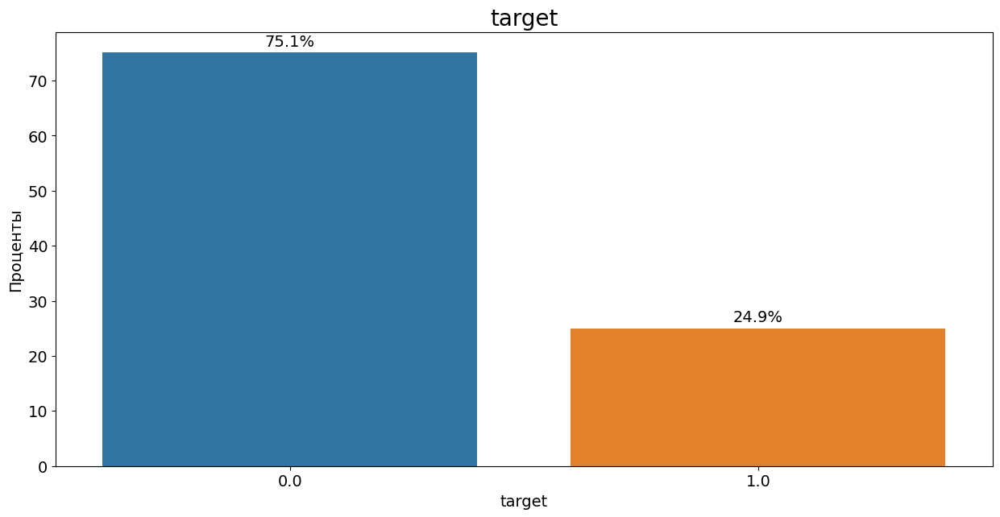

In [12]:
vf.barplot_percent('target', df)

Дисбаланс есть

5) Сравнить при помощи displot значение индекса города для тех кто ищет и кто не ищет работу (похожее задание было в ДЗ EDA). Есть ли разница?

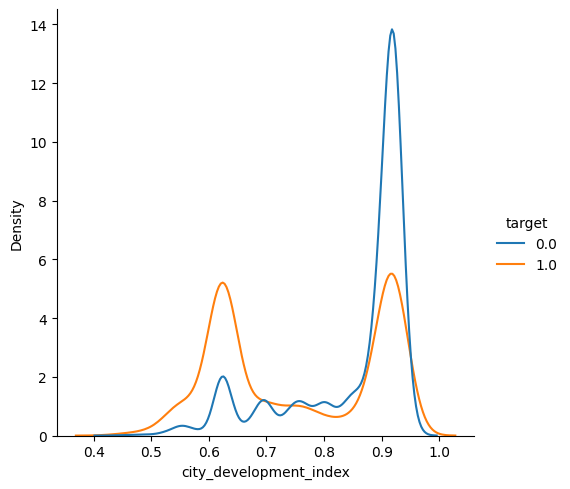

In [13]:
sns.displot(data=df, x='city_development_index', hue='target', common_norm=False, kind='kde')

Разница есть, среди согласных на работу людей больше в процентном выражении,чем тех, кто живет в городе с меньшим индексом развития, чем среди людей, которые работу не ищут.  

6) Сравнить при помощи displot значение кол-во завершенных часов обучения для тех кто ищет и кто не ищет работу (похожее задание было в ДЗ EDA). Есть ли разница?

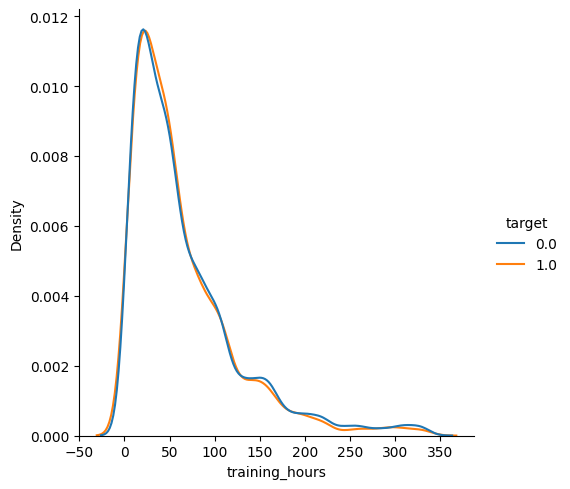

In [12]:
sns.displot(data=df, x='training_hours', hue='target', common_norm=False, kind='kde')

Различий нет.

7) Построить график boxplot для такого параметра как city_development_index (по OY) в разрезе relevent_experience (по OX), сравнив все эти показатели относительно target (hue).

Что можно сказать, глядя на график?

<AxesSubplot:xlabel='relevent_experience', ylabel='city_development_index'>

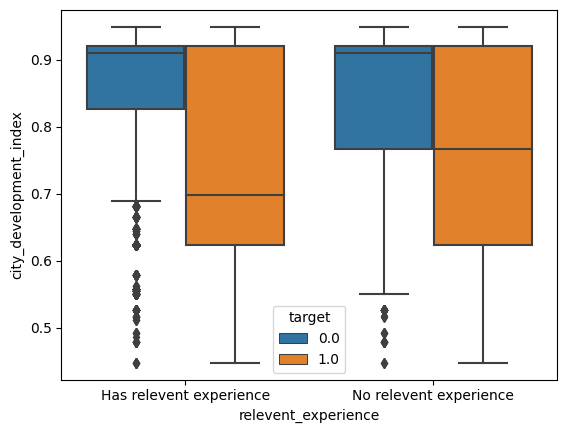

In [13]:
sns.boxplot(data=df, x='relevent_experience', y='city_development_index', hue='target')

Медианное значение индекса развития города среди людей, согласных на работу и не имеющих релевантного опыта, выше медианного значения индекса развития города среди людей, согласных на работу и имеющих релевантный опыт.

8) Отобразите на графиках долю людей, которые ищут/не ищут работу, по каждому из значений признаков:

- В качестве признаков взять колонки: 

['gender', 'relevent_experience', 'enrolled_university', 'education_level', 'major_discipline', 'experience', 'company_size', 'company_type', 'last_new_job']

- Можно написать отдельный метод для вывода графика, в который вы будете подавать датасет, колонку_1 для анализа (список выше), колонку_2 - target
- Графики можно вывести в цикле путем прохождения по списку признаков выше
- Данные должны быть **нормированы на кол-во людей для каждого из значений целевой переменной target**
- Не забудьте указать цифры (%) на графике для каждого бара, как это делалось ранее
- **Какие выводы** вы можете сделать? напишите кратко

**Пример:**

Если  работу искало (target=1) всего 120 людей, мужчин 20 и женщин 100, то тогда в нормированном варианте должно быть мужчин - 17%, женщин 83% для target=1

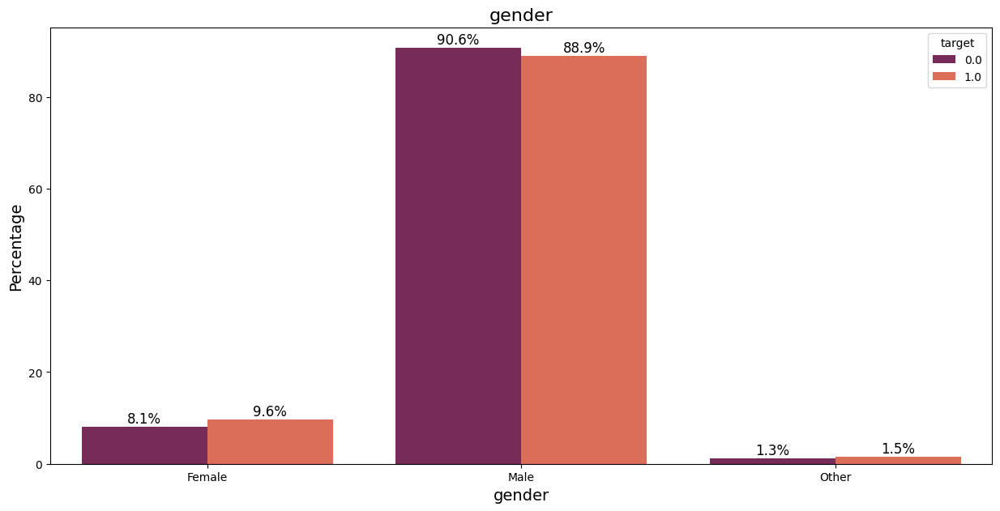

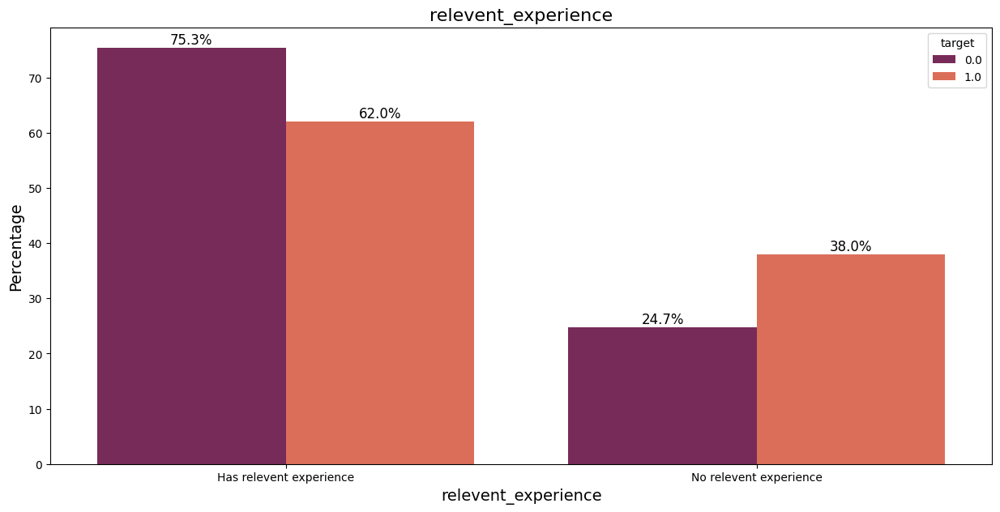

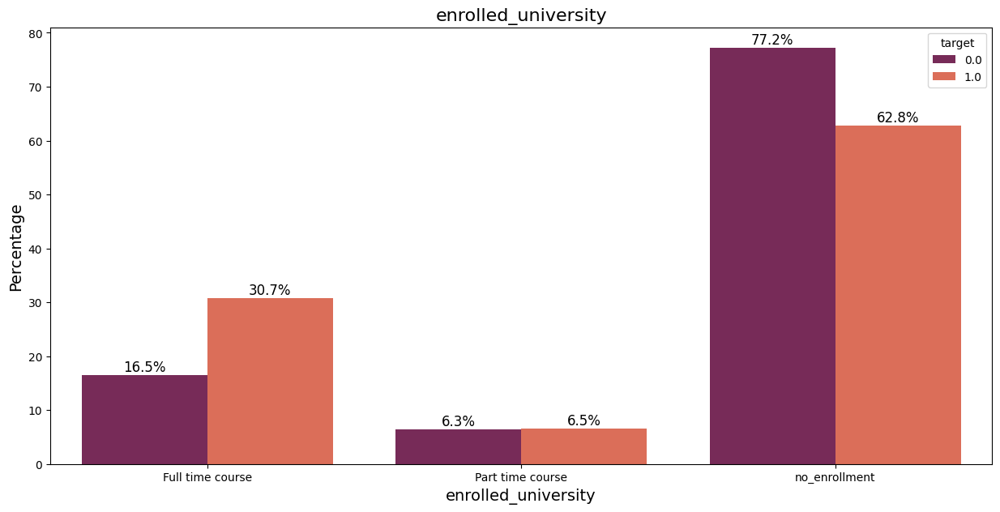

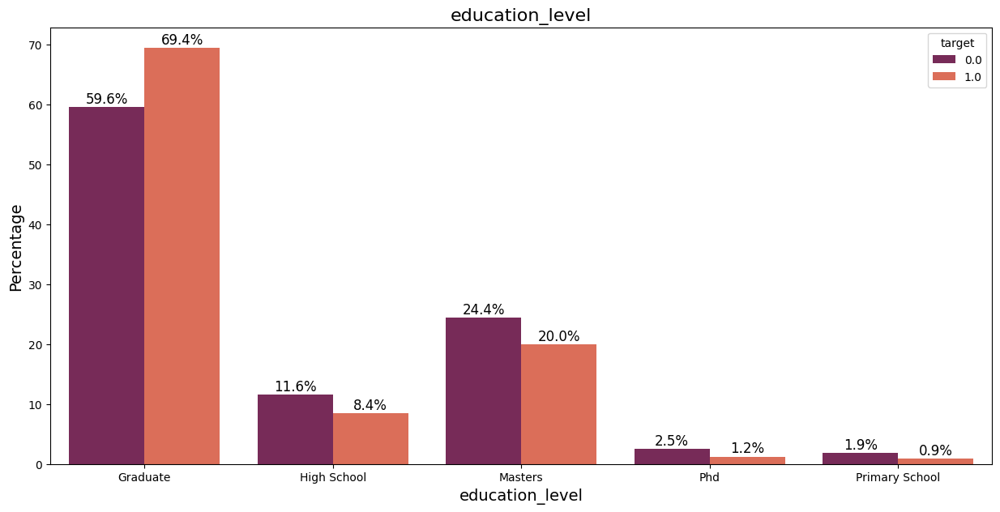

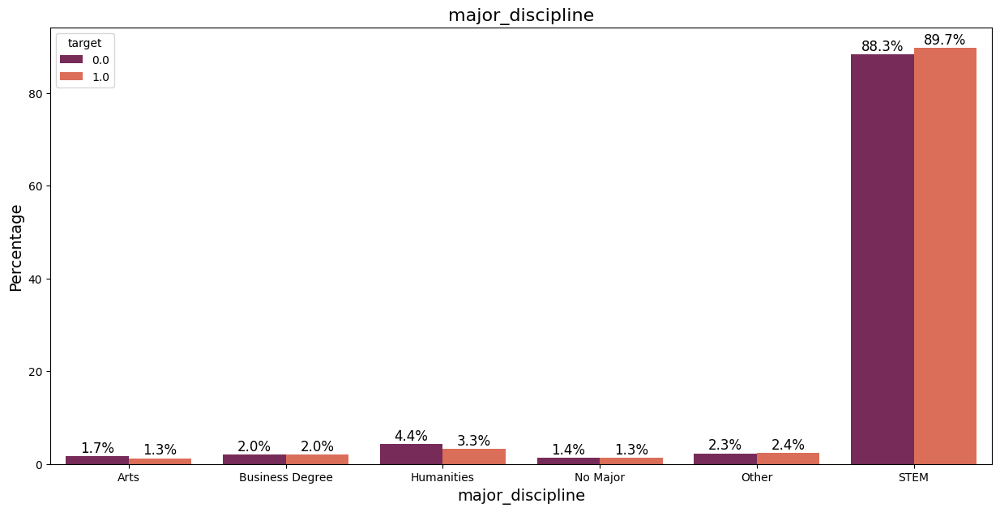

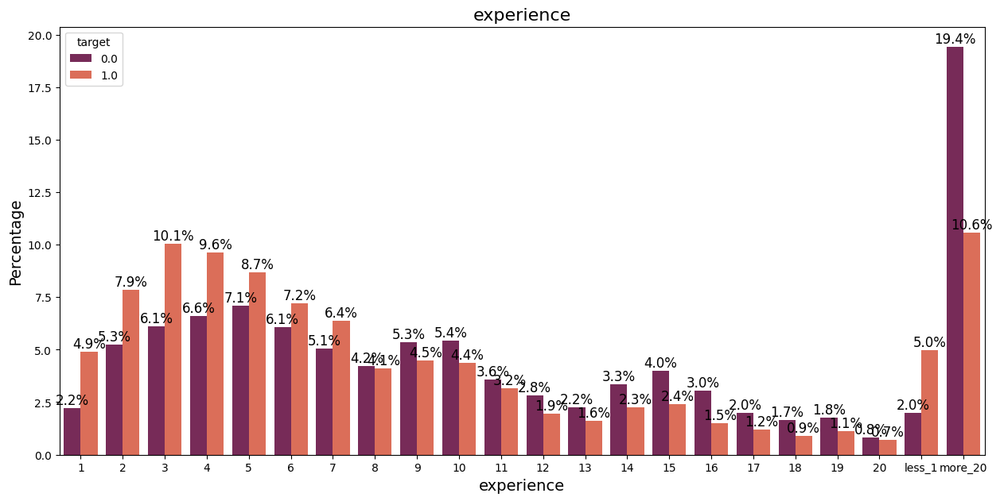

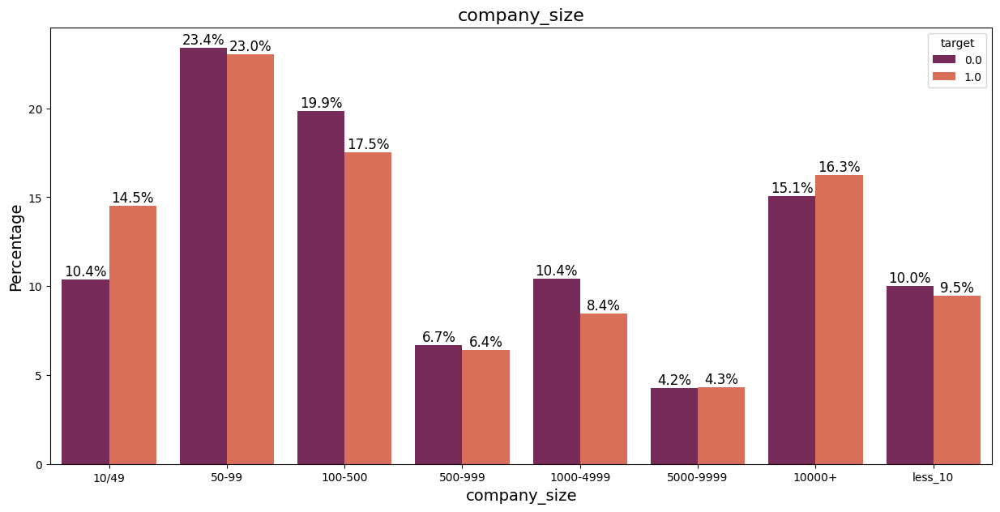

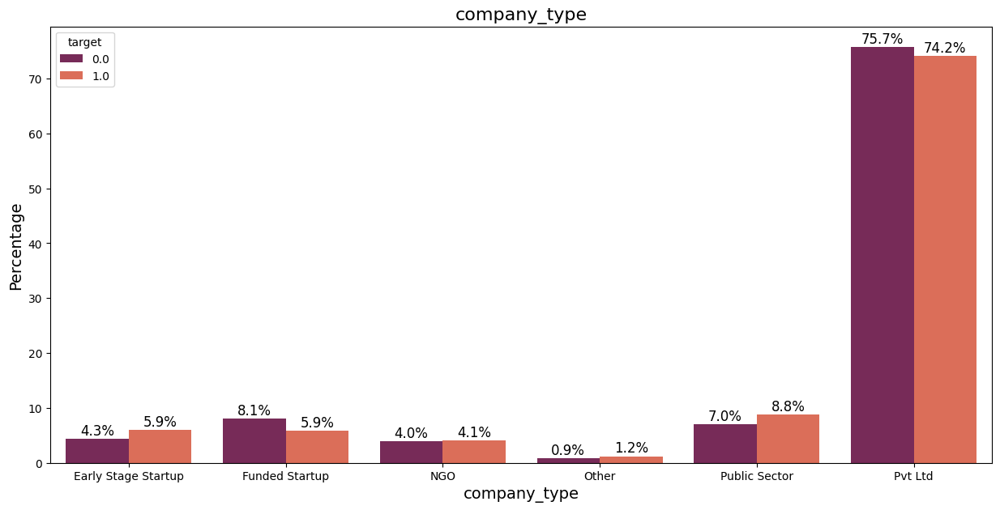

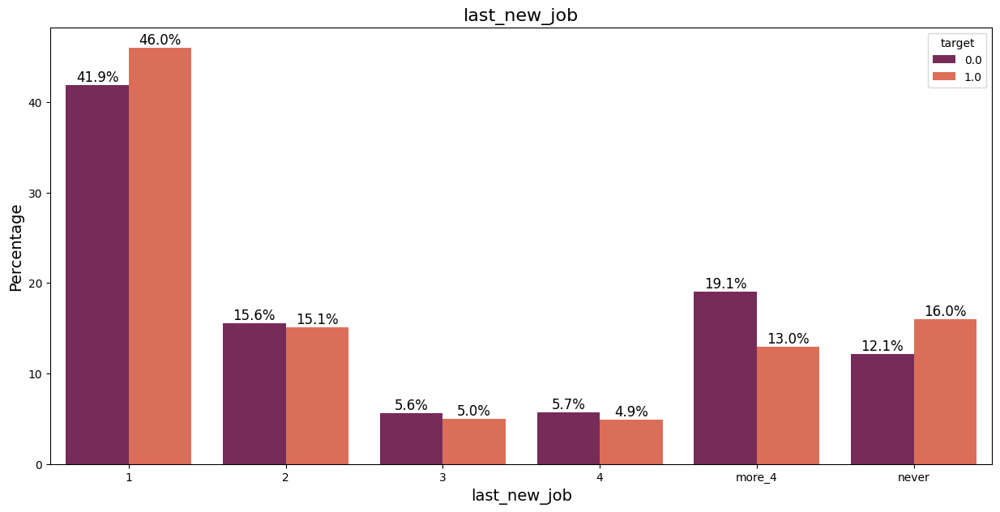

In [14]:
cols_main = ['gender', 'relevent_experience', 'enrolled_university', 'education_level', 'major_discipline', 'experience', 'company_size', 'company_type', 'last_new_job']

for col_main in cols_main:
    vf.barplot_group(df, col_main, 'target', col_main)

В процентном выражении сформировались следующие выводы: пол не влияет на целевую переменную; людей, имеющие опыт менее 8 и согласных на работу, больше, чем тех, кто имеет опыт менее 8 лет и работу не ищет; касаемо людей с опыт более 8 лет, ситуация обратная; людей, обучившихся на полном курсе в университете и согласных на работу, больше, чем тех, кто учился на полном курсе университета и работу не ищет; размер компании не влияет на целевую переменную; влияние уровня образования, так как различия в процентах не значительны и присутствует дисбаланс в признаке; та же ситуация с типом компании и основной специальностью по образованию; люди, у которых между прошлой и нынешней работами прошел год и менее, больше заинтересованы в работе 

9) Сгенерируйте дополнительные признаки (бины)б добавьте их в датасет, использовать метод pandas.cut():

- **city_development_bins** - на основе признака city_development_index, внутренние параметры:
    - bins=[0, 0.5, 0.6, 1], right=True, labels=['low', 'middle', 'high']

- **training_hours_bins** - на основе признака training_hours, внутренние параметры:
    - bins=[0, 50, 200, 500], right=True, labels=['low', 'middle', 'high']

In [15]:
df["city_development_bins"] = pd.cut(df.city_development_index, 
                                     bins=[0, 0.5, 0.6, 1], 
                                     right=True, 
                                     labels=['low', 'middle', 'high'])
df['training_hours_bins'] = pd.cut(df.training_hours, 
                                   bins=[0, 50, 200, 500], 
                                   right=True, 
                                   labels=['low', 'middle', 'high'])

In [16]:
df = df.drop(['city_development_index', 'training_hours'], axis=1)

10) Заполните пропуски в датасете

In [17]:
df.isna().sum()/df.shape[0] * 100

enrollee_id               0.000000
city                      0.000000
gender                   23.530640
relevent_experience       0.000000
enrolled_university       2.014824
education_level           2.401086
major_discipline         14.683161
experience                0.339284
company_size             30.994885
company_type             32.049274
last_new_job              2.207955
target                    0.000000
city_development_bins     0.000000
training_hours_bins       0.000000
dtype: float64

In [18]:
df.fillna('Unknown', inplace=True)

11) Перевести признаки типа object в категориальный тип данных

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   enrollee_id            19158 non-null  int64   
 1   city                   19158 non-null  object  
 2   gender                 19158 non-null  object  
 3   relevent_experience    19158 non-null  object  
 4   enrolled_university    19158 non-null  object  
 5   education_level        19158 non-null  object  
 6   major_discipline       19158 non-null  object  
 7   experience             19158 non-null  object  
 8   company_size           19158 non-null  object  
 9   company_type           19158 non-null  object  
 10  last_new_job           19158 non-null  object  
 11  target                 19158 non-null  float64 
 12  city_development_bins  19158 non-null  category
 13  training_hours_bins    19158 non-null  category
dtypes: category(2), float64(1), int64(1), 

In [20]:
for col in df.columns:
    df[col] = df[col].astype('category')

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   enrollee_id            19158 non-null  category
 1   city                   19158 non-null  category
 2   gender                 19158 non-null  category
 3   relevent_experience    19158 non-null  category
 4   enrolled_university    19158 non-null  category
 5   education_level        19158 non-null  category
 6   major_discipline       19158 non-null  category
 7   experience             19158 non-null  category
 8   company_size           19158 non-null  category
 9   company_type           19158 non-null  category
 10  last_new_job           19158 non-null  category
 11  target                 19158 non-null  category
 12  city_development_bins  19158 non-null  category
 13  training_hours_bins    19158 non-null  category
dtypes: category(14)
memory usage: 954.7 KB

In [22]:
df = df.drop(['enrollee_id'], axis=1)
x = df.drop(['target'], axis=1)
y = df['target']

# Modeling
## XGBoost
### Baseline

12) Обучите Baseline XGBoost:

- с ранней остановкой early_stopping_rounds
- предварительно разбейте данные на train/validation/test (**бинаризуйте категориальный признаки**)
    - как пример без создания новой переменной: ```X = pd.get_dummies(df.drop(['enrollee_id', 'target'], axis=1))```
- если ваша версия xgboost позволяет обрабатывать категориальные признаки, то используйте датасет с category признаками
- не забывайте про фиксацию random_state
- не забываем про stratify
- в качесте eval_metric возьмите "auc"
- также учесть, что у вас дисбаланс классов (использовать scale_pos_weight)
- добавьте результаты в датасет с метриками - **metrics**
- проверьте, не **переобучилась** ли модель

Аккуратно вычисляйте scale_pos_weight, ручной способ не использовать!

In [23]:
from xgboost import XGBClassifier
import get_metrics

In [24]:
x_xgb = pd.get_dummies(x)

In [25]:
x_train, x_test, y_train, y_test = train_test_split(x_xgb,
                                                    y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=RAND)

In [26]:
x_train_, x_val_, y_train_, y_val_ = train_test_split(x_train,
                                                      y_train,
                                                      test_size=0.2,
                                                      stratify=y_train,
                                                      random_state=RAND)

ratio = df[df.target == 0].shape[0]/df[df.target == 1].shape[0]

In [27]:
model = XGBClassifier(scale_pos_weight=ratio, random_state=RAND)

model.fit(x_train_, y_train_,
          eval_set=[(x_val_, y_val_)],
          eval_metric='auc',
          early_stopping_rounds=100,
          verbose=0)

/home/user/jupyter_env/lib/python3.8/site-packages/xgboost/sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/xgboost/sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=10, ...)

In [28]:
y_pred = model.predict(x_train_)
y_score = model.predict_proba(x_train_)

metrics = get_metrics.get_metrics_classification(
    y_train_, y_pred, y_score, "XGBoost_baseline_train")

In [29]:
y_pred = model.predict(x_test)
y_score = model.predict_proba(x_test)

metrics = metrics.append(get_metrics.get_metrics_classification(
    y_test, y_pred, y_score, "XGBoost_baseline_test"))

/tmp/ipykernel_8272/1216779364.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(get_metrics.get_metrics_classification(


In [30]:
metrics

,model,Accuracy,ROC_AUC,Precision,Recall,f1,Logloss
0,XGBoost_baseline_train,0.797961,0.857366,0.57032,0.769382,0.655062,0.479278
0,XGBoost_baseline_test,0.771921,0.792327,0.53113,0.723560,0.612589,0.530623


Классы разделимы, переобучение присутствует, но не значительное.

## LightGBM
### Baseline

13) Обучите Baseline LightGBM:

- с ранней остановкой early_stopping_rounds
- предварительно разбейте данные на train/validation/test - **для категориальный данных**, то есть прошлые разбиения для XGBoost не используем!
- не забывайте про фиксацию random_state
- в качесте eval_metric возьмите "auc"
- также учесть, что у вас дисбаланс классов (использовать scale_pos_weight)
- добавьте результаты в датасет с метриками - metrics
- проверьте, не **переобучилась** ли модель

In [31]:
from lightgbm import LGBMClassifier

In [32]:
x_train, x_test, y_train, y_test = train_test_split(x,
                                                    y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=RAND)

In [33]:
x_train_, x_val_, y_train_, y_val_ = train_test_split(x_train,
                                                      y_train,
                                                      test_size=0.2,
                                                      stratify=y_train,
                                                      random_state=RAND)

ratio = df[df.target == 0].shape[0]/df[df.target == 1].shape[0]

In [34]:
model = LGBMClassifier(scale_pos_weight=ratio, random_state=RAND)

model.fit(x_train_, y_train_,
          eval_metric='auc',
          eval_set=[(x_val_, y_val_)],
          early_stopping_rounds=100,
          verbose=0)

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

LGBMClassifier(random_state=10, scale_pos_weight=3.0104668201800293)

In [35]:
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': 10,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'scale_pos_weight': 3.0104668201800293}

In [36]:
y_pred = model.predict(x_train_)
y_score = model.predict_proba(x_train_)

metrics = pd.concat([metrics, get_metrics.get_metrics_classification(
    y_train_, y_pred, y_score, "LGBM_baseline_train")])

In [37]:
y_pred = model.predict(x_test)
y_score = model.predict_proba(x_test)

metrics = pd.concat([metrics, get_metrics.get_metrics_classification(
    y_test, y_pred, y_score, "LGBM_baseline_test")])

In [38]:
metrics

,model,Accuracy,ROC_AUC,Precision,Recall,f1,Logloss
0,XGBoost_baseline_train,0.797961,0.857366,0.570320,0.769382,0.655062,0.479278
0,XGBoost_baseline_test,0.771921,0.792327,0.531130,0.723560,0.612589,0.530623
0,LGBM_baseline_train,0.803344,0.873060,0.576868,0.792934,0.667861,0.459327
0,LGBM_baseline_test,0.773747,0.796387,0.533537,0.732984,0.617556,0.519213


Метрики практически идентичны метрикам XGBoost

## Catboost
### baseline

14) Обучите Baseline Catboost:

- с ранней остановкой early_stopping_rounds
- Можно использовать разбиения train/validation/test на предыдущей итерации в LightGBM
- не забывайте про фиксацию random_state
- в качесте eval_metric возьмите "AUC" (подается в экземпляр класса)
- также учесть, что у вас дисбаланс классов (использовать scale_pos_weight)
- добавьте результаты в датасет с метриками - metrics
- проверьте, не **переобучилась** ли модель

In [39]:
from catboost import CatBoostClassifier

In [40]:
model = CatBoostClassifier(random_state=RAND,
                           scale_pos_weight=ratio,
                           eval_metric="AUC",
                           cat_features=x_train_.columns.tolist()
                           )

model.fit(x_train_, y_train_,
          eval_set=[(x_val_, y_val_)],
          early_stopping_rounds=100,
          verbose=0)

In [41]:
y_pred = model.predict(x_train_)
y_score = model.predict_proba(x_train_)

metrics = pd.concat([metrics, get_metrics.get_metrics_classification(
    y_train_, y_pred, y_score, 'Catboost_baseline_train')])

In [42]:
y_pred = model.predict(x_test)
y_score = model.predict_proba(x_test)

metrics = pd.concat([metrics, get_metrics.get_metrics_classification(
    y_test, y_pred, y_score, 'Catboost_baseline_test')])

In [43]:
metrics

,model,Accuracy,ROC_AUC,Precision,Recall,f1,Logloss
0,XGBoost_baseline_train,0.797961,0.857366,0.570320,0.769382,0.655062,0.479278
0,XGBoost_baseline_test,0.771921,0.792327,0.531130,0.723560,0.612589,0.530623
0,LGBM_baseline_train,0.803344,0.873060,0.576868,0.792934,0.667861,0.459327
0,LGBM_baseline_test,0.773747,0.796387,0.533537,0.732984,0.617556,0.519213
0,Catboost_baseline_train,0.792822,0.825787,0.563592,0.749428,0.643359,0.504184
0,Catboost_baseline_test,0.779489,0.792532,0.542768,0.730890,0.622936,0.528674


Метрики на тесте практически идентичны метрикам двух других моделей, переобучения нет

# Tuning

15) Выберите лучший Baseline:
    
- найдите для него оптимальные параметры (лучше всего использовать Optuna, для Catboost можно RandomSearch)
- показатели на тесте должны **быть лучшими среди предыдущих результатов** (ориентируемся на ROC-AUC)
- попробуйте использовать pruning в Optuna (если используете данный метод)
- обучите модель на лучших параметрах (пока без использования кросс-валидации)
- добавьте результаты в датасет с метриками - metrics

In [44]:
import optuna
import scipy.stats as stats

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

<div class="alert alert-block alert-warning"> 
Ниже грубая ошибка =) Пересмотрите лекцию практическую по бустингам, а именно как подбирали параметры, об этом говорила =)
</div>

In [46]:
def objective_gpt(trial: optuna.Trial, x, y):
    params = {
        'learning_rate': trial.suggest_categorical('n_estimators', [1100]),
#        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.0757125443665628]),
        'max_bin': trial.suggest_int('max_bin', 100, 1000),
        'num_leaves': trial.suggest_int('num_leaves', 10, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 100, 70000, step=100),
        'lambda_l1': trial.suggest_int('lambda_l1', 0, 100),
        'lambda_l2': trial.suggest_int('lambda_l2', 0, 100),
        'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
        'objective': trial.suggest_categorical('objective', ['binary']),
        'metric': trial.suggest_categorical('metric', ['auc']),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'random_state': trial.suggest_categorical('random_state', [RAND]),
    }

    cv_pred = np.empty(N_FOLDS)
    cv = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=RAND)

    for fold, (train_idx, test_idx) in enumerate(cv.split(x, y)):
        x_train_, x_val_ = x.iloc[train_idx], x.iloc[test_idx]
        y_train_, y_val_ = y.iloc[train_idx], y.iloc[test_idx]

        ratio = y_train_[y_train_ == 0].shape[0] / \
            y_train_[y_train_ == 1].shape[0]

        pruning = optuna.integration.LightGBMPruningCallback(trial, 'auc')

        model = LGBMClassifier(
            scale_pos_weight=ratio,
            n_jobs=-1,
            **params
        )
        model.fit(x_train_, y_train_,
                  eval_metric='auc',
                  eval_set=[(x_val_, y_val_)],
                  early_stopping_rounds=100,
                  callbacks=[pruning],
                  verbose=0)

        y_pred = model.predict(x_val_)
        y_proba = model.predict_proba(x_val_)[:, 1]

        cv_pred[fold] = roc_auc_score(y_val_, y_proba)
    return (np.mean(cv_pred))

In [47]:
func = lambda trial: objective_gpt(trial, x_train, y_train)

study = optuna.create_study(direction="maximize")
study.optimize(func, n_trials=10, show_progress_bar=True, n_jobs=-1)

[I 2023-02-18 18:41:35,259] A new study created in memory with name: no-name-0635da34-23e8-41b5-87a4-0433774cfb75
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/10 [00:00<?, ?it/s]

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/tmp/ipykern

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


[LightGBM] [Warning] feature_fraction is set=0.4077064036292041, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4077064036292041
[LightGBM] [Warning] lambda_l1 is set=83, reg_alpha=0.0 will be ignored. Current value: lambda_l1=83
[LightGBM] [Warning] bagging_fraction is set=0.6504553299700376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504553299700376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.4642357651259187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4642357651259187
[LightGBM] [Warning] lambda_l1 is set=97, reg_alpha=0.0 will be ignored. Current value: lambda_l1=97
[LightGBM] [Warning] bagging_fraction is set=0.3525372186819217, subsample=1.0 will be ignored. Current value: bagging_fraction=0.352

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_s

[LightGBM] [Warning] feature_fraction is set=0.4077064036292041, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4077064036292041
[LightGBM] [Warning] lambda_l1 is set=83, reg_alpha=0.0 will be ignored. Current value: lambda_l1=83
[LightGBM] [Warning] bagging_fraction is set=0.6504553299700376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504553299700376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.4642357651259187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4642357651259187
[LightGBM] [Warning] lambda_l1 is set=97, reg_alpha=0.0 will be ignored. Current value: lambda_l1=97
[LightGBM] [Warning] bagging_fraction is set=0.3525372186819217, subsample=1.0 will be ignored. Current value: bagging_fraction=0.352

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.7370385674484523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7370385674484523
[LightGBM] [Warning] lambda_l1 is set=69, reg_alpha=0.0 will be ignored. Current value: lambda_l1=69
[LightGBM] [Warning] bagging_fraction is set=0.818638335781009, subsample=1.0 will be ignored. Current value: bagging_fraction=0.818638335781009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.4077064036292041, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4077064036292041
[LightGBM] [Warning] lambda_l1 is set=83, reg_alpha=0.0 will be ignored. Current value: lambda_l1=83
[LightGBM] [Warning] bagging_fraction is set=0.6504553299700376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504553299700376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.4642357651259187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4642357651259187
[LightGBM] [Warning] lambda_l1 is set=97, reg_alpha=0.0 will be ignored. Current value: lambda_l1=97
[LightGBM] [Warning] bagging_fraction is set=0.3525372186819217, subsample=1.0 will be ignored. Current value: bagging_fraction=0.352

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7370385674484523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7370385674484523
[LightGBM] [Warning] lambda_l1 is set=69, reg_alpha=0.0 will be ignored. Current value: lambda_l1=69
[LightGBM] [Warning] bagging_fraction is set=0.818638335781009, subsample=1.0 will be ignored. Current value: bagging_fraction=0.818638335781009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.4077064036292041, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4077064036292041
[LightGBM] [Warning] lambda_l1 is set=83, reg_alpha=0.0 will be ignored. Current value: lambda_l1=83
[LightGBM] [Warning] bagging_fraction is set=0.6504553299700376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504553299700376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.4642357651259187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4642357651259187
[LightGBM] [Warning] lambda_l1 is set=97, reg_alpha=0.0 will be ignored. Current value: lambda_l1=97
[LightGBM] [Warning] bagging_fraction is set=0.3525372186819217, subsample=1.0 will be ignored. Current value: bagging_fraction=0.352

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.4642357651259187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4642357651259187
[LightGBM] [Warning] lambda_l1 is set=97, reg_alpha=0.0 will be ignored. Current value: lambda_l1=97
[LightGBM] [Warning] bagging_fraction is set=0.3525372186819217, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3525372186819217
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] feature_fraction is set=0.4077064036292041, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4077064036292041
[LightGBM] [Warning] lambda_l1 is set=83, reg_alpha=0.0 will be ignored. Current value: lambda_l1=83
[LightGBM] [Warning] bagging_fraction is set=0.6504553299700376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.650

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split

[I 2023-02-18 18:41:39,395] Trial 7 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 839, 'num_leaves': 78, 'max_depth': 19, 'min_child_samples': 13900, 'lambda_l1': 97, 'lambda_l2': 52, 'min_split_gain': 0.03946667842396205, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.4642357651259187, 'bagging_fraction': 0.3525372186819217, 'bagging_freq': 2, 'random_state': 10}. Best is trial 7 with value: 0.5.
[I 2023-02-18 18:41:39,504] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 570, 'num_leaves': 248, 'max_depth': 16, 'min_child_samples': 13000, 'lambda_l1': 83, 'lambda_l2': 84, 'min_split_gain': 0.0008313561081300898, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.4077064036292041, 'bagging_fraction': 0.6504553299700376, 'bagging_freq': 1, 'random_state': 10}. Best is trial 7 with value: 0.5.
[I 2023-02-18 18:41:39,558] Trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.6178260879337962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6178260879337962
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.5395306260591499, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5395306260591499
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] feature_fraction is set=0.4300483311924356, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4300483311924356
[LightGBM] [Warning] lambda_l1 is set=53, reg_alpha=0.0 will be ignored. Current value: lambda_l1=53
[LightGBM] [Warning] bagging_fraction is set=0.6726583313005943, subsample=1.0 will be ignored. Current value: bagging_fraction=0.672

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.4300483311924356, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4300483311924356
[LightGBM] [Warning] lambda_l1 is set=53, reg_alpha=0.0 will be ignored. Current value: lambda_l1=53
[LightGBM] [Warning] bagging_fraction is set=0.6726583313005943, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6726583313005943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] feature_fraction is set=0.6178260879337962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6178260879337962
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.5395306260591499, subsample=1.0 will be ignored. Current value: bagging_fraction=0.539

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:40,306] Trial 3 finished with value: 0.797607423592526 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 703, 'num_leaves': 277, 'max_depth': 8, 'min_child_samples': 1300, 'lambda_l1': 69, 'lambda_l2': 95, 'min_split_gain': 0.041789669769398775, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7370385674484523, 'bagging_fraction': 0.818638335781009, 'bagging_freq': 1, 'random_state': 10}. Best is trial 3 with value: 0.797607423592526.
[LightGBM] [Warning] feature_fraction is set=0.6178260879337962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6178260879337962
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.5395306260591499, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5395306260591499
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current val

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:49

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/o

[LightGBM] [Warning] feature_fraction is set=0.4300483311924356, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4300483311924356
[LightGBM] [Warning] lambda_l1 is set=53, reg_alpha=0.0 will be ignored. Current value: lambda_l1=53
[LightGBM] [Warning] bagging_fraction is set=0.6726583313005943, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6726583313005943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] feature_fraction is set=0.6178260879337962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6178260879337962
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.5395306260591499, subsample=1.0 will be ignored. Current value: bagging_fraction=0.539

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.4300483311924356, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4300483311924356
[LightGBM] [Warning] lambda_l1 is set=53, reg_alpha=0.0 will be ignored. Current value: lambda_l1=53
[LightGBM] [Warning] bagging_fraction is set=0.6726583313005943, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6726583313005943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] feature_fraction is set=0.6178260879337962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6178260879337962
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.5395306260591499, subsample=1.0 will be ignored. Current value: bagging_fraction=0.539

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:41,282] Trial 9 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 685, 'num_leaves': 407, 'max_depth': 18, 'min_child_samples': 41000, 'lambda_l1': 53, 'lambda_l2': 40, 'min_split_gain': 0.001835196976450461, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.4300483311924356, 'bagging_fraction': 0.6726583313005943, 'bagging_freq': 1, 'random_state': 10}. Best is trial 3 with value: 0.797607423592526.
[I 2023-02-18 18:41:41,300] Trial 8 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 997, 'num_leaves': 216, 'max_depth': 4, 'min_child_samples': 59400, 'lambda_l1': 24, 'lambda_l2': 77, 'min_split_gain': 0.05880980819459318, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.6178260879337962, 'bagging_fraction': 0.5395306260591499, 'bagging_freq': 2, 'random_state': 10}. Best is trial 3 with value: 0.797607423592526.


In [48]:
study.optimize(func, n_trials=50, show_progress_bar=True, n_jobs=-1)

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/tmp/ipykern

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


[LightGBM] [Warning] feature_fraction is set=0.9304248454088907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9304248454088907
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9981936653420973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9981936653420973
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9933694082610705, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9933694082610705
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9994696572409578, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.9933694082610705, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9933694082610705
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9994696572409578, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9994696572409578
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.9678164417151545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9678164417151545
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9904245241848381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9904245241848381
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning

[LightGBM] [Warning] feature_fraction is set=0.9906573805834472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9906573805834472
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9951227979946682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9951227979946682
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9294045863474998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9294045863474998
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9868086808401707, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9253561225451791, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9253561225451791
[LightGBM] [Warning] lambda_l1 is set=76, reg_alpha=0.0 will be ignored. Current value: lambda_l1=76
[LightGBM] [Warning] bagging_fraction is set=0.9996334724185914, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9996334724185914
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] feature_fraction is set=0.9750979287485712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9750979287485712
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9812737189671955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.981

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9933694082610705, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9933694082610705
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9994696572409578, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9994696572409578
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9304248454088907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9304248454088907
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9981936653420973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9981936653420973
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9678164417151545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9678164417151545
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9904245241848381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.990

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9906573805834472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9906573805834472
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9951227979946682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9951227979946682
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9294045863474998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9294045863474998
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9868086808401707, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9933694082610705, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9933694082610705
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9994696572409578, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9994696572409578
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.9253561225451791, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9253561225451791
[LightGBM] [Warning] lambda_l1 is set=76, reg_alpha=0.0 will be ignored. Current value: lambda_l1=76
[LightGBM] [Warning] bagging_fraction is set=0.9996334724185914, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9750979287485712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9750979287485712
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9812737189671955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9812737189671955
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.9865588096591135, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9865588096591135
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9925116491229942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.992

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9933694082610705, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9933694082610705
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9994696572409578, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9994696572409578
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.9906573805834472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9906573805834472
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9951227979946682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9304248454088907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9304248454088907
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9981936653420973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9981936653420973
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9253561225451791, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9253561225451791
[LightGBM] [Warning] lambda_l1 is set=76, reg_alpha=0.0 will be ignored. Current value: lambda_l1=76
[LightGBM] [Warning] bagging_fraction is set=0.9996334724185914, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9678164417151545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9678164417151545
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9904245241848381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9904245241848381
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] feature_fraction is set=0.9865588096591135, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9865588096591135
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9925116491229942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.992

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:47,043] Trial 16 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 126, 'num_leaves': 488, 'max_depth': 8, 'min_child_samples': 21500, 'lambda_l1': 35, 'lambda_l2': 100, 'min_split_gain': 0.005213309344596592, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9933694082610705, 'bagging_fraction': 0.9994696572409578, 'bagging_freq': 3, 'random_state': 10}. Best is trial 3 with value: 0.797607423592526.
[LightGBM] [Warning] feature_fraction is set=0.9750979287485712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9750979287485712
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9812737189671955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9812737189671955
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: baggin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8139000343584768, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139000343584768
[LightGBM] [Warning] lambda_l1 is set=74, reg_alpha=0.0 will be ignored. Current value: lambda_l1=74
[LightGBM] [Warning] bagging_fraction is set=0.28493792934602075, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28493792934602075
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9906573805834472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9906573805834472
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9951227979946682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9951227979946682
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9294045863474998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9294045863474998
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9868086808401707, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:48,025] Trial 12 finished with value: 0.7929722830557578 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 124, 'num_leaves': 163, 'max_depth': 8, 'min_child_samples': 3700, 'lambda_l1': 34, 'lambda_l2': 99, 'min_split_gain': 0.005314822566824749, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9678164417151545, 'bagging_fraction': 0.9904245241848381, 'bagging_freq': 3, 'random_state': 10}. Best is trial 3 with value: 0.797607423592526.
[LightGBM] [Warning] feature_fraction is set=0.9457464404852186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9457464404852186
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9738478388768177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9738478388768177
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9253561225451791, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9253561225451791
[LightGBM] [Warning] lambda_l1 is set=76, reg_alpha=0.0 will be ignored. Current value: lambda_l1=76
[LightGBM] [Warning] bagging_fraction is set=0.9996334724185914, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9996334724185914
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] feature_fraction is set=0.8139000343584768, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139000343584768
[LightGBM] [Warning] lambda_l1 is set=74, reg_alpha=0.0 will be ignored. Current value: lambda_l1=74
[LightGBM] [Warning] bagging_fraction is set=0.28493792934602075, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9304248454088907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9304248454088907
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9981936653420973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9981936653420973
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:41:48,891] Trial 17 finished with value: 0.7973680763761208 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 451, 'num_leaves': 153, 'max_depth': 8, 'min_child_samples': 2100, 'lambda_l1': 37, 'lambda_l2': 98, 'min_split_gain': 0.004846347675560174, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9906573805834472, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

[LightGBM] [Warning] feature_fraction is set=0.9865588096591135, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9865588096591135
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9925116491229942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9925116491229942
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.9750979287485712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9750979287485712
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9812737189671955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.981

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:49,337] Trial 14 finished with value: 0.7984144923665728 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 133, 'num_leaves': 171, 'max_depth': 8, 'min_child_samples': 1800, 'lambda_l1': 36, 'lambda_l2': 97, 'min_split_gain': 0.006238790736117417, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9294045863474998, 'bagging_fraction': 0.9868086808401707, 'bagging_freq': 3, 'random_state': 10}. Best is trial 14 with value: 0.7984144923665728.
[LightGBM] [Warning] feature_fraction is set=0.8165526712455285, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165526712455285
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.859760966610575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.859760966610575
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already repor

[I 2023-02-18 18:41:50,000] Trial 15 finished with value: 0.7990040448155186 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 456, 'num_leaves': 169, 'max_depth': 8, 'min_child_samples': 800, 'lambda_l1': 76, 'lambda_l2': 99, 'min_split_gain': 0.006121777623014903, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9253561225451791, 'bagging_fraction': 0.9996334724185914, 'bagging_freq': 3, 'random_state': 10}. Best is trial 15 with value: 0.7990040448155186.
[LightGBM] [Warning] feature_fraction is set=0.8139000343584768, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139000343584768
[LightGBM] [Warning] lambda_l1 is set=74, reg_alpha=0.0 will be ignored. Current value: lambda_l1=74
[LightGBM] [Warning] bagging_fraction is set=0.28493792934602075, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28493792934602075
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Curre

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9457464404852186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9457464404852186
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9738478388768177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9738478388768177
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.7638085423087189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638085423087189
[LightGBM] [Warning] lambda_l1 is set=78, reg_alpha=0.0 will be ignored. Current value: lambda_l1=78
[LightGBM] [Warning] bagging_fraction is set=0.8795877564187702, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8795877564187702
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:41:50,646] Trial 13 finished with value: 0.8001664686395926 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 480, 'num_leaves': 168, 'max_depth': 9, 'min_child_samples': 900, 'lambda_l1': 39, 'lambda_l2': 92, 'min_split_gain': 0.005838502238997424, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9865588096591135, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8165526712455285, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165526712455285
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.859760966610575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.859760966610575
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] feature_fraction is set=0.8663809209455027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663809209455027
[LightGBM] [Warning] lambda_l1 is set=81, reg_alpha=0.0 will be ignored. Current value: lambda_l1=81
[LightGBM] [Warning] bagging_fraction is set=0.21695911173947818, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2169

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:51,023] Trial 11 finished with value: 0.8002798149158868 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 131, 'num_leaves': 167, 'max_depth': 8, 'min_child_samples': 700, 'lambda_l1': 33, 'lambda_l2': 94, 'min_split_gain': 0.005224866458071405, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9750979287485712, 'bagging_fraction': 0.9812737189671955, 'bagging_freq': 3, 'random_state': 10}. Best is trial 11 with value: 0.8002798149158868.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8373974306347294, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8373974306347294
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8704751828689301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704751828689301
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] feature_fraction is set=0.9304248454088907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9304248454088907
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9981936653420973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99819

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8139000343584768, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139000343584768
[LightGBM] [Warning] lambda_l1 is set=74, reg_alpha=0.0 will be ignored. Current value: lambda_l1=74
[LightGBM] [Warning] bagging_fraction is set=0.28493792934602075, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28493792934602075
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] feature_fraction is set=0.8779009203534971, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8779009203534971
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] bagging_fraction is set=0.8997338217039718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.7638085423087189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638085423087189
[LightGBM] [Warning] lambda_l1 is set=78, reg_alpha=0.0 will be ignored. Current value: lambda_l1=78
[LightGBM] [Warning] bagging_fraction is set=0.8795877564187702, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8795877564187702
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8663809209455027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663809209455027
[LightGBM] [Warning] lambda_l1 is set=81, reg_alpha=0.0 will be ignored. Current value: lambda_l1=81
[LightGBM] [Warning] bagging_fraction is set=0.21695911173947818, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8165526712455285, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165526712455285
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.859760966610575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.859760966610575
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8373974306347294, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8373974306347294
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8704751828689301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704751828689301
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8779009203534971, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8779009203534971
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] bagging_fraction is set=0.8997338217039718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8997338217039718
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] feature_fraction is set=0.8139000343584768, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139000343584768
[LightGBM] [Warning] lambda_l1 is set=74, reg_alpha=0.0 will be ignored. Current value: lambda_l1=74
[LightGBM] [Warning] bagging_fraction is set=0.28493792934602075, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.8663809209455027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663809209455027
[LightGBM] [Warning] lambda_l1 is set=81, reg_alpha=0.0 will be ignored. Current value: lambda_l1=81
[LightGBM] [Warning] bagging_fraction is set=0.21695911173947818, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21695911173947818
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] feature_fraction is set=0.7638085423087189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638085423087189
[LightGBM] [Warning] lambda_l1 is set=78, reg_alpha=0.0 will be ignored. Current value: lambda_l1=78
[LightGBM] [Warning] bagging_fraction is set=0.8795877564187702, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8165526712455285, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165526712455285
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.859760966610575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.859760966610575
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[I 2023-02-18 18:41:53,570] Trial 10 finished with value: 0.8014035273914086 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 520, 'num_leaves': 494, 'max_depth': 8, 'min_child_samples': 100, 'lambda_l1': 37, 'lambda_l2': 97, 'min_split_gain': 0.006034385868139294, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9304248454088907, 'baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8373974306347294, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8373974306347294
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8704751828689301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704751828689301
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] feature_fraction is set=0.8323164085314708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8323164085314708
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.878955224519112, subsample=1.0 will be ignored. Current value: bagging_fraction=0.87895522

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8779009203534971, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8779009203534971
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] bagging_fraction is set=0.8997338217039718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8997338217039718
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[I 2023-02-18 18:41:54,298] Trial 18 finished with value: 0.7895015311350233 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 552, 'num_leaves': 374, 'max_depth': 9, 'min_child_samples': 700, 'lambda_l1': 74, 'lambda_l2': 2, 'min_split_gain': 0.060334038250818074, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8139000343584768, 'bagg

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_f

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.858626724750037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.858626724750037
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] bagging_fraction is set=0.8855920636889114, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8855920636889114
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] feature_fraction is set=0.8663809209455027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663809209455027
[LightGBM] [Warning] lambda_l1 is set=81, reg_alpha=0.0 will be ignored. Current value: lambda_l1=81
[LightGBM] [Warning] bagging_fraction is set=0.21695911173947818, subsample=1.0 will be ignored. Current value: bagging_fraction=0.216959

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.7638085423087189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638085423087189
[LightGBM] [Warning] lambda_l1 is set=78, reg_alpha=0.0 will be ignored. Current value: lambda_l1=78
[LightGBM] [Warning] bagging_fraction is set=0.8795877564187702, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8795877564187702
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8165526712455285, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165526712455285
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.859760966610575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8597

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8373974306347294, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8373974306347294
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8704751828689301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704751828689301
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] feature_fraction is set=0.8323164085314708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8323164085314708
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.878955224519112, subsample=1.0 will be ignored. Current value: bagging_fraction=0.87895522

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8779009203534971, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8779009203534971
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] bagging_fraction is set=0.8997338217039718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8997338217039718
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.9457464404852186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9457464404852186
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9738478388768177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9738478388768177
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8663809209455027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663809209455027
[LightGBM] [Warning] lambda_l1 is set=81, reg_alpha=0.0 will be ignored. Current value: lambda_l1=81
[LightGBM] [Warning] bagging_fraction is set=0.21695911173947818, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:56,118] Trial 21 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 516, 'num_leaves': 17, 'max_depth': 10, 'min_child_samples': 51400, 'lambda_l1': 75, 'lambda_l2': 68, 'min_split_gain': 0.017199254104443208, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8165526712455285, 'bagging_fraction': 0.859760966610575, 'bagging_freq': 5, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:41:56,289] Trial 20 finished with value: 0.7894875299843509 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 480, 'num_leaves': 39, 'max_depth': 9, 'min_child_samples': 3600, 'lambda_l1': 78, 'lambda_l2': 89, 'min_split_gain': 0.02042705996995883, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7638085423087189, 'bagging_fraction': 0.8795877564187702, 'bagging_freq': 5, 'random_state': 10}. Best is trial 10 with value: 0.8014035

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8940010213526238, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8940010213526238
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] bagging_fraction is set=0.88053011041967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.88053011041967
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] feature_fraction is set=0.902482552970155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.902482552970155
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9079861181963899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.90798611819

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:56,892] Trial 22 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 443, 'num_leaves': 32, 'max_depth': 10, 'min_child_samples': 48200, 'lambda_l1': 80, 'lambda_l2': 69, 'min_split_gain': 0.0017913055120689942, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8779009203534971, 'bagging_fraction': 0.8997338217039718, 'bagging_freq': 5, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[I 2023-02-18 18:41:57,201] Trial 23 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 479, 'num_leaves': 13, 'max_depth': 11, 'min_child_samples': 18200, 'lambda_l1': 81, 'lambda_l2': 66, 'min_split_gain': 0.001591944550062184, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8663809209455027, 'bagging_fraction': 0.21695911173947818, 'bagging_freq': 5, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.915459120829759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.915459120829759
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9194494985514511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9194494985514511
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: baggin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:41:57,567] Trial 19 finished with value: 0.800179351857996 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 447, 'num_leaves': 162, 'max_depth': 8, 'min_child_samples': 600, 'lambda_l1': 38, 'lambda_l2': 98, 'min_split_gain': 0.0034155413761605947, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9457464404852186, 'bagging_fraction': 0.9738478388768177, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.9965257431728134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9965257431728134
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9170916075064834, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9170916075064834
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[I 2023-02-18 18:41:57,876] Trial 24 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 240, 'num_leaves': 43, 'max_depth': 11, 'min_child_samples': 18800, 'lambda_l1': 0, 'lambda_l2': 70, 'min_split_gain': 0.0019580755344666646, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8373974306347294, 'bagging_fraction

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.902482552970155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.902482552970155
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9079861181963899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9079861181963899
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] feature_fraction is set=0.9084336635353646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9084336635353646
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.904151302617273, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904151

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.916993052432576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.916993052432576
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] bagging_fraction is set=0.7493397819367102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7493397819367102
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] feature_fraction is set=0.915459120829759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.915459120829759
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9194494985514511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9194494

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.858626724750037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.858626724750037
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] bagging_fraction is set=0.8855920636889114, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8855920636889114
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9965257431728134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9965257431728134
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9170916075064834, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9170916075064834
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.8940010213526238, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8940010213526238
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] bagging_fraction is set=0.88053011041967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8805301

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.902482552970155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.902482552970155
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9079861181963899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9079861181963899
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] feature_fraction is set=0.9084336635353646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9084336635353646
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.904151302617273, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904151

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.916993052432576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.916993052432576
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] bagging_fraction is set=0.7493397819367102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7493397819367102
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] feature_fraction is set=0.915459120829759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.915459120829759
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9194494985514511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9194494

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.858626724750037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.858626724750037
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] bagging_fraction is set=0.8855920636889114, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8855920636889114
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.9965257431728134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9965257431728134
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9170916075064834, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9170916075064834
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.8940010213526238, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8940010213526238
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] bagging_fraction is set=0.88053011041967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8805301

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.902482552970155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.902482552970155
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9079861181963899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9079861181963899
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] feature_fraction is set=0.9084336635353646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9084336635353646
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.904151302617273, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904151

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] bagging_fraction is set=0.7493397819367102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7493397819367102
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] feature_fraction is set=0.915459120829759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.915459120829759
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9194494985514511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9194494985514511
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9233057683392161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9233057683392161
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.7502366674163404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7502366674163404
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[I 2023-02-18 18:42:01,683] Trial 26 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 231, 'num_leaves': 34, 'max_depth': 11, 'min_child_samples': 19500, 'lambda_l1': 1, 'lambda_l2': 67, 'min_split_gain': 0.0014545975600901708, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.858626724750037, 'bagging_fraction'

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning:

[LightGBM] [Warning] feature_fraction is set=0.9965257431728134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9965257431728134
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9170916075064834, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9170916075064834
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9272120823272554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9272120823272554
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.9287992137772406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.928

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[LightGBM] [Warning] feature_fraction is set=0.902482552970155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.902482552970155
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9079861181963899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9079861181963899
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] feature_fraction is set=0.9084336635353646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9084336635353646
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.904151302617273, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904151

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.915459120829759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.915459120829759
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9194494985514511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9194494985514511
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9233057683392161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9233057683392161
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.7502366674163404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75023

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:03,558] Trial 27 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 231, 'num_leaves': 494, 'max_depth': 5, 'min_child_samples': 19700, 'lambda_l1': 8, 'lambda_l2': 66, 'min_split_gain': 0.0021890316070251044, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8940010213526238, 'bagging_fraction': 0.88053011041967, 'bagging_freq': 5, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9965257431728134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9965257431728134
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9170916075064834, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9170916075064834
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:151

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:03,842] Trial 28 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 372, 'num_leaves': 105, 'max_depth': 6, 'min_child_samples': 12100, 'lambda_l1': 45, 'lambda_l2': 67, 'min_split_gain': 0.0021989469793739684, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.902482552970155, 'bagging_fraction': 0.9079861181963899, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9084336635353646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9084336635353646
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.904151302617273, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904151302617273
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[I 2023-02-18 18:42:04,174] Trial 29 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 330, 'num_leaves': 92, 'max_depth': 6, 'min_child_samples': 13900, 'lambda_l1': 45, 'lambda_l2': 85, 'min_split_gain': 0.0022513768068307366, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.915459120829759, 'bagging_fraction': 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9233057683392161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9233057683392161
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.7502366674163404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7502366674163404
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] feature_fraction is set=0.9284189687534629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284189687534629
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.7501317600309176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.750

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:04,844] Trial 30 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 204, 'num_leaves': 222, 'max_depth': 6, 'min_child_samples': 12000, 'lambda_l1': 43, 'lambda_l2': 85, 'min_split_gain': 0.002682147836245536, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9965257431728134, 'bagging_fraction': 0.9170916075064834, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9436802578340757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9436802578340757
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.7580250686477278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7580250686477278
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9272120823272554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9272120823272554
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.9287992137772406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9287992137772406
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:05,374] Trial 31 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 225, 'num_leaves': 220, 'max_depth': 6, 'min_child_samples': 10400, 'lambda_l1': 24, 'lambda_l2': 83, 'min_split_gain': 0.0028655448918391644, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9084336635353646, 'bagging_fraction': 0.904151302617273, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:42:05,474] Trial 32 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 368, 'num_leaves': 99, 'max_depth': 6, 'min_child_samples': 10400, 'lambda_l1': 46, 'lambda_l2': 82, 'min_split_gain': 0.0031997421209164637, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.916993052432576, 'bagging_fraction': 0.7493397819367102, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The repo

[LightGBM] [Warning] feature_fraction is set=0.9303762080727759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9303762080727759
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.785757189144473, subsample=1.0 will be ignored. Current value: bagging_fraction=0.785757189144473
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] feature_fraction is set=0.9284189687534629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284189687534629
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.7501317600309176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75013

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.96139738089852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.96139738089852
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.9468639342487506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9468639342487506
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9523019396471651, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9523019396471651
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.9467959598807222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9467959

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9272120823272554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9272120823272554
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.9287992137772406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9287992137772406
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.952076031763246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.952076031763246
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7588571823845246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7588571823845246
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9303762080727759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9303762080727759
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.785757189144473, subsample=1.0 will be ignored. Current value: bagging_fraction=0.785757

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9284189687534629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284189687534629
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.7501317600309176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7501317600309176
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] feature_fraction is set=0.9233057683392161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9233057683392161
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.7502366674163404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.750

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9436802578340757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9436802578340757
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.7580250686477278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7580250686477278
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] feature_fraction is set=0.9272120823272554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9272120823272554
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.9287992137772406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.928

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.952076031763246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.952076031763246
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7588571823845246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7588571823845246
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9303762080727759, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9303762080727759
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.785757189144473, subsample=1.0 will be ignored. Current value: bagging_fraction=0.785757

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:08,619] Trial 33 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 330, 'num_leaves': 215, 'max_depth': 6, 'min_child_samples': 10000, 'lambda_l1': 29, 'lambda_l2': 83, 'min_split_gain': 0.003164567383996354, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9233057683392161, 'bagging_fraction': 0.7502366674163404, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9284189687534629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284189687534629
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.7501317600309176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7501317600309176
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9523019396471651, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9523019396471651
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.9467959598807222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9467959598807222
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.96139738089852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.96139738089852
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.9468639342487506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9468639

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9436802578340757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9436802578340757
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.7580250686477278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7580250686477278
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] feature_fraction is set=0.9667431678349452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9667431678349452
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9500456463472123, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

[LightGBM] [Warning] feature_fraction is set=0.952076031763246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.952076031763246
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7588571823845246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7588571823845246
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9634196226644453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9634196226644453
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9390443623636403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.93904

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning

[LightGBM] [Warning] feature_fraction is set=0.9284189687534629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284189687534629
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.7501317600309176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7501317600309176
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] feature_fraction is set=0.9523019396471651, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9523019396471651
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.9467959598807222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.946

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.96139738089852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.96139738089852
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.9468639342487506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9468639342487506
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9436802578340757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9436802578340757
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.7580250686477278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7580250

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9667431678349452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9667431678349452
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9500456463472123, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9500456463472123
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:11,026] Trial 35 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 352, 'num_leaves': 106, 'max_depth': 6, 'min_child_samples': 10200, 'lambda_l1': 25, 'lambda_l2': 83, 'min_split_gain': 0.0031957160390292975, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9303762080727759, 'bagging_fraction': 0.785757189144473, 'bagging_freq': 4, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9634196226644453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9634196226644453
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9390443623636403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9390443623636403
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:11,388] Trial 36 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 570, 'num_leaves': 230, 'max_depth': 3, 'min_child_samples': 8600, 'lambda_l1': 27, 'lambda_l2': 83, 'min_split_gain': 0.011353334254460827, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9284189687534629, 'bagging_fraction': 0.7501317600309176, 'bagging_freq': 4, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9523019396471651, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9523019396471651
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.9467959598807222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9467959598807222
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9716530206598428, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9716530206598428
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9561832773621719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.956

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argume

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.96139738089852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.96139738089852
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.9468639342487506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9468639342487506
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.9685055305600132, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9685055305600132
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9484076095734137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9484076

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:12,431] Trial 38 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 590, 'num_leaves': 198, 'max_depth': 3, 'min_child_samples': 7500, 'lambda_l1': 25, 'lambda_l2': 90, 'min_split_gain': 0.003552551344926506, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.952076031763246, 'bagging_fraction': 0.7588571823845246, 'bagging_freq': 4, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9973044463465248, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9973044463465248
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9501107863222279, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9501107863222279
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9634196226644453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9634196226644453
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9390443623636403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9390443623636403
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:13,044] Trial 39 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 613, 'num_leaves': 342, 'max_depth': 13, 'min_child_samples': 7900, 'lambda_l1': 24, 'lambda_l2': 91, 'min_split_gain': 0.009550287505890789, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9523019396471651, 'bagging_fraction': 0.9467959598807222, 'bagging_freq': 4, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.7866796127863969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7866796127863969
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9473612446619196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9473612446619196
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[LightGBM] [Warning] feature_fraction is set=0.9716530206598428, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9716530206598428
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9561832773621719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9561832773621719
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[I 2023-02-18 18:42:13,419] Trial 40 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 415, 'num_leaves': 130, 'max_depth': 3, 'min_child_samples': 7100, 'lambda_l1': 29, 'lambda_l2': 90, 'min_split_gain': 0.009355169749817423, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.96139738089852, 'bagging_fraction': 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

[LightGBM] [Warning] feature_fraction is set=0.9685055305600132, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9685055305600132
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9484076095734137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9484076095734137
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9667431678349452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9667431678349452
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9500456463472123, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored be

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9973044463465248, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9973044463465248
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9501107863222279, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9501107863222279
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9634196226644453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9634196226644453
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9390443623636403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.939

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7866796127863969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7866796127863969
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9473612446619196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9473612446619196
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9716530206598428, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9716530206598428
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9561832773621719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9561832773621719
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.9685055305600132, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9685055305600132
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9484076095734137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.948

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7153105124488618, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7153105124488618
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9548195357349918, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9548195357349918
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9969855440815765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969855440815765
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9520651184904357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9520651184904357
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.9973044463465248, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9973044463465248
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9501107863222279, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7866796127863969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7866796127863969
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9473612446619196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9473612446619196
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9716530206598428, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9716530206598428
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9561832773621719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9561832773621719
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[I 2023-02-18 18:42:16,294] Trial 41 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 612, 'num_leaves': 337, 'max_depth': 13, 'min_child_samples': 26300, 'lambda_l1': 18, 'lambda_l2': 93, 'min_split_gain': 0.00959177457565426, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9667431678349452, 'bagging_fraction

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7153105124488618, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7153105124488618
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9548195357349918, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9548195357349918
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/skle

[I 2023-02-18 18:42:16,872] Trial 42 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 616, 'num_leaves': 337, 'max_depth': 3, 'min_child_samples': 29100, 'lambda_l1': 58, 'lambda_l2': 91, 'min_split_gain': 0.0009506776153741134, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9634196226644453, 'bagging_fraction': 0.9390443623636403, 'bagging_freq': 4, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9969855440815765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969855440815765
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9520651184904357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9520651184904357
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7866796127863969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7866796127863969
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9473612446619196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9473612446619196
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.7841432352040335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7841432352040335
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.970873620419026, subsample=1.0 will be ignored. Current value: bagging_fraction=0.970873620419026
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9716530206598428, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9716530206598428
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9561832773621719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95618

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.7153105124488618, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7153105124488618
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9548195357349918, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9548195357349918
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.9685055305600132, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9685055305600132
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9484076095734137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.948

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9969855440815765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969855440815765
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9520651184904357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9520651184904357
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.9973044463465248, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9973044463465248
[LightGBM] [Warning] lambda_l1 is set=59, reg_alpha=0.0 will be ignored. Current value: lambda_l1=59
[LightGBM] [Warning] bagging_fraction is set=0.9501107863222279, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9473612446619196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9473612446619196
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:18,934] Trial 43 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 598, 'num_leaves': 257, 'max_depth': 13, 'min_child_samples': 26900, 'lambda_l1': 58, 'lambda_l2': 93, 'min_split_gain': 0.009752472032621829, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9716530206598428, 'bagging_fraction': 0.9561832773621719, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:42:19,119] Trial 44 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 611, 'num_leaves': 325, 'max_depth': 14, 'min_child_samples': 26500, 'lambda_l1': 59, 'lambda_l2': 91, 'min_split_gain': 0.0009529112881279723, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9685055305600132, 'bagging_fraction': 0.9484076095734137, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.801403527391408

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7841432352040335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7841432352040335
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.970873620419026, subsample=1.0 will be ignored. Current value: bagging_fraction=0.970873620419026
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.7153105124488618, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7153105124488618
[LightGBM] [Warning] lambda_l1 is set=58, reg_alpha=0.0 will be ignored. Current value: lambda_l1=58
[LightGBM] [Warning] bagging_fraction is set=0.9548195357349918, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95481

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7799724135105998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7799724135105998
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.8338812394949714, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8338812394949714
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[I 2023-02-18 18:42:19,824] Trial 45 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 608, 'num_leaves': 267, 'max_depth': 14, 'min_child_samples': 26500, 'lambda_l1': 59, 'lambda_l2': 91, 'min_split_gain': 0.0008675747897904664, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9973044463465248, 'bagging_fracti

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9969855440815765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969855440815765
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9520651184904357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9520651184904357
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.7889347374559981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7889347374559981
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.9953365451659553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.995

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9959137401996161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9959137401996161
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9616464248621042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9616464248621042
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7125784723768702, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7125784723768702
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9983001339315909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9983001339315909
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] feature_fraction is set=0.718480814636576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.718480814636576
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9980105851685175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99801

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.7799724135105998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7799724135105998
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.8338812394949714, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8338812394949714
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[I 2023-02-18 18:42:21,237] Trial 48 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 806, 'num_leaves': 183, 'max_depth': 7, 'min_child_samples': 27200, 'lambda_l1': 60, 'lambda_l2': 95, 'min_split_gain': 0.0075378018287694535, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9969855440815765, 'bagging_fractio

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.9834371402832317, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9834371402832317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7889347374559981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7889347374559981
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.9953365451659553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9953365451659553
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.9959137401996161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9959137401996161
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9616464248621042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.961

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.87122502184995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.87122502184995
[LightGBM] [Warning] lambda_l1 is set=87, reg_alpha=0.0 will be ignored. Current value: lambda_l1=87
[LightGBM] [Warning] bagging_fraction is set=0.9855589763755266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9855589763755266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] feature_fraction is set=0.718480814636576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.718480814636576
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9980105851685175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.998010585

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7841432352040335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7841432352040335
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.970873620419026, subsample=1.0 will be ignored. Current value: bagging_fraction=0.970873620419026
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7799724135105998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7799724135105998
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.8338812394949714, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8338812394949714
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8675403082895141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8675403082895141
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.9834371402832317, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9834371402832317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7889347374559981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7889347374559981
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.9953365451659553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9953365451659553
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.9959137401996161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9959137401996161
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9616464248621042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.961

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.87122502184995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.87122502184995
[LightGBM] [Warning] lambda_l1 is set=87, reg_alpha=0.0 will be ignored. Current value: lambda_l1=87
[LightGBM] [Warning] bagging_fraction is set=0.9855589763755266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9855589763755266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.718480814636576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.718480814636576
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9980105851685175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9980105851685175
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] feature_fraction is set=0.7125784723768702, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7125784723768702
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9983001339315909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99830

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7799724135105998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7799724135105998
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.8338812394949714, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8338812394949714
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] feature_fraction is set=0.8675403082895141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8675403082895141
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.9834371402832317, subsample=1.0 will be ignored. Current value: bagging_fraction=0.983

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

[I 2023-02-18 18:42:24,631] Trial 49 finished with value: 0.7758252026650668 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 520, 'num_leaves': 272, 'max_depth': 9, 'min_child_samples': 4300, 'lambda_l1': 60, 'lambda_l2': 76, 'min_split_gain': 0.006382593504685187, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9959137401996161, 'bagging_fraction': 0.9616464248621042, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.7889347374559981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7889347374559981
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.9953365451659553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9953365451659553
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curren

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.87122502184995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.87122502184995
[LightGBM] [Warning] lambda_l1 is set=87, reg_alpha=0.0 will be ignored. Current value: lambda_l1=87
[LightGBM] [Warning] bagging_fraction is set=0.9855589763755266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9855589763755266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

[LightGBM] [Warning] feature_fraction is set=0.718480814636576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.718480814636576
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9980105851685175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9980105851685175
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[I 2023-02-18 18:42:25,214] Trial 50 finished with value: 0.7776420183487354 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 756, 'num_leaves': 269, 'max_depth': 9, 'min_child_samples': 4300, 'lambda_l1': 67, 'lambda_l2': 96, 'min_split_gain': 0.006087480459122541, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7841432352040335, 'bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750754892072184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750754892072184
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.9959466732032015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9959466732032015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.7799724135105998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7799724135105998
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.8338812394949714, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8675403082895141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8675403082895141
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.9834371402832317, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9834371402832317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] feature_fraction is set=0.8751414005758585, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8751414005758585
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9962654427278479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.7889347374559981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7889347374559981
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.9953365451659553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9953365451659553
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.87122502184995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.87122502184995
[LightGBM] [Warning] lambda_l1 is set=87, reg_alpha=0.0 will be ignored. Current value: lambda_l1=87
[LightGBM] [Warning] bagging_fraction is set=0.9855589763755266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9855589

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.718480814636576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.718480814636576
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9980105851685175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9980105851685175
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] feature_fraction is set=0.7125784723768702, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7125784723768702
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9983001339315909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99830

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:26,936] Trial 51 finished with value: 0.6844330677059055 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 505, 'num_leaves': 183, 'max_depth': 9, 'min_child_samples': 4800, 'lambda_l1': 98, 'lambda_l2': 74, 'min_split_gain': 0.005552114792809889, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7799724135105998, 'bagging_fraction': 0.8338812394949714, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_frac

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8675403082895141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8675403082895141
[LightGBM] [Warning] lambda_l1 is set=67, reg_alpha=0.0 will be ignored. Current value: lambda_l1=67
[LightGBM] [Warning] bagging_fraction is set=0.9834371402832317, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9834371402832317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] feature_fraction is set=0.8750754892072184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750754892072184
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.9959466732032015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.995

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8750237753195232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750237753195232
[I 2023-02-18 18:42:27,749] Trial 52 finished with value: 0.794357535936346 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 745, 'num_leaves': 185, 'max_depth': 9, 'min_child_samples': 3500, 'lambda_l1': 90, 'lambda_l2': 75, 'min_split_gain': 0.006515879890194847, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7889347374559981, 'bagging_fraction': 0.9953365451659553, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.994391340465881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.994391340465881
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:27,955] Trial 54 finished with value: 0.7401941640724738 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 734, 'num_leaves': 184, 'max_depth': 9, 'min_child_samples': 5000, 'lambda_l1': 39, 'lambda_l2': 74, 'min_split_gain': 0.006535491165521463, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.718480814636576, 'bagging_fraction': 0.9980105851685175, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:42:28,051] Trial 53 finished with value: 0.7556550620884137 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 783, 'num_leaves': 173, 'max_depth': 9, 'min_child_samples': 4700, 'lambda_l1': 91, 'lambda_l2': 76, 'min_split_gain': 0.006721452218216044, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7125784723768702, 'bagging_fraction': 0.9983001339315909, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:28,378] Trial 55 finished with value: 0.7103433618970217 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 510, 'num_leaves': 193, 'max_depth': 9, 'min_child_samples': 5200, 'lambda_l1': 67, 'lambda_l2': 76, 'min_split_gain': 0.0045564029655904975, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8675403082895141, 'bagging_fraction': 0.9834371402832317, 'bagging_freq': 1, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[I 2023-02-18 18:42:28,597] Trial 56 finished with value: 0.7770226125553188 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 896, 'num_leaves': 68, 'max_depth': 9, 'min_child_samples': 4400, 'lambda_l1': 87, 'lambda_l2': 42, 'min_split_gain': 0.0049224852407554085, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.87122502184995, 'bagging_fraction': 0.9855589763755266, 'bagging_freq': 1, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.8750754892072184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750754892072184
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.9959466732032015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9959466732032015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8751414005758585, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8751414005758585
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9962654427278479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9962654427278479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8750237753195232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750237753195232
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.994391340465881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750754892072184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750754892072184
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.9959466732032015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9959466732032015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8751414005758585, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8751414005758585
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9962654427278479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9962654427278479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750237753195232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750237753195232
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.994391340465881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.994391340465881
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750754892072184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750754892072184
[LightGBM] [Warning] lambda_l1 is set=98, reg_alpha=0.0 will be ignored. Current value: lambda_l1=98
[LightGBM] [Warning] bagging_fraction is set=0.9959466732032015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9959466732032015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8751414005758585, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8751414005758585
[LightGBM] [Warning] lambda_l1 is set=91, reg_alpha=0.0 will be ignored. Current value: lambda_l1=91
[LightGBM] [Warning] bagging_fraction is set=0.9962654427278479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-package

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750237753195232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750237753195232
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.994391340465881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.994391340465881
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:31,332] Trial 57 finished with value: 0.7997307440636383 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 723, 'num_leaves': 150, 'max_depth': 7, 'min_child_samples': 300, 'lambda_l1': 98, 'lambda_l2': 100, 'min_split_gain': 0.0045203289352599915, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8750754892072184, 'bagging_fraction': 0.9959466732032015, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:31,542] Trial 58 finished with value: 0.7998568651429867 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 149, 'num_leaves': 167, 'max_depth': 7, 'min_child_samples': 200, 'lambda_l1': 91, 'lambda_l2': 100, 'min_split_gain': 0.004290739163654976, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8751414005758585, 'bagging_fraction': 0.9962654427278479, 'bagging_freq': 1, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.8750237753195232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750237753195232
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.994391340465881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.994391340465881
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:32,077] Trial 59 finished with value: 0.8005290590955007 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 149, 'num_leaves': 155, 'max_depth': 7, 'min_child_samples': 500, 'lambda_l1': 38, 'lambda_l2': 100, 'min_split_gain': 0.00481214068594777, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8750237753195232, 'bagging_fraction': 0.994391340465881, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


In [49]:
study.optimize(func, n_trials=200, show_progress_bar=True, n_jobs=-1)

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/200 [00:00<?, ?it/s]

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/j

[LightGBM] [Warning] feature_fraction is set=0.8434182256202531, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8434182256202531
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8528187445439619, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8528187445439619
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.893781754087962, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.893781754087962
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9128108817567344, subsample=1.0 will be ignored. Current value: bagging_fraction=0.912

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780:

[LightGBM] [Warning] feature_fraction is set=0.8309247694335141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309247694335141
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9089767340660359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9089767340660359
[LightGBM] [Warning] feature_fraction is set=0.8404833395450446, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8404833395450446
[LightGBM] [Warning] lambda_l1 is set=51, reg_alpha=0.0 will be ignored. Current value: lambda_l1=51
[LightGBM] [Warning] bagging_fraction is set=0.8513776068734196, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8513776068734196
[LightGBM] [Warning] [LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be i

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/

[LightGBM] [Warning] feature_fraction is set=0.8418712282777061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8418712282777061
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8477776028075392, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8477776028075392
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8434182256202531, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8434182256202531
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8528187445439619, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8528187445439619
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8396954106930713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8396954106930713
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.8513667443000669, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8513667443000669
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8309247694335141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309247694335141
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9089767340660359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8418712282777061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8418712282777061
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8477776028075392, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8477776028075392
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8434182256202531, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8434182256202531
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8528187445439619, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8528187445439619
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8309247694335141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309247694335141
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9089767340660359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9089767340660359
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8396954106930713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8396954106930713
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.8513667443000669, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8418712282777061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8418712282777061
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8477776028075392, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8477776028075392
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8381074758728444, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8381074758728444
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.8957863117549218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8957863117549218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8309247694335141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309247694335141
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9089767340660359, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8418712282777061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8418712282777061
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8477776028075392, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8477776028075392
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:42:39,258] Trial 63 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 163, 'num_leaves': 143, 'max_depth': 7, 'min_child_samples': 35100, 'lambda_l1': 32, 'lambda_l2': 100, 'min_split_gain': 0.004096820573342743, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8396954106930713, 'bagging_fraction': 0.8513667443000669, 'bagging_freq': 7, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:42:39,261] Trial 66 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 175, 'num_leaves': 440, 'max_depth': 7, 'min_child_samples': 14900, 'lambda_l1': 40, 'lambda_l2': 100, 'min_split_gain': 0.014860575466617404, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8381074758728444, 'bagging_fraction': 0.8957863117549218, 'bagging_freq': 1, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:39,543] Trial 62 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 145, 'num_leaves': 441, 'max_depth': 7, 'min_child_samples': 69200, 'lambda_l1': 52, 'lambda_l2': 100, 'min_split_gain': 0.012799584600848584, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8309247694335141, 'bagging_fraction': 0.9089767340660359, 'bagging_freq': 6, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:42:39,553] Trial 67 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 170, 'num_leaves': 432, 'max_depth': 7, 'min_child_samples': 15200, 'lambda_l1': 51, 'lambda_l2': 100, 'min_split_gain': 0.004099972688477046, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8404833395450446, 'bagging_fraction': 0.8513776068734196, 'bagging_freq': 7, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.8434182256202531, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8434182256202531
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.8528187445439619, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8528187445439619
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8813153073814108, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813153073814108
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9734792653025519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726

[LightGBM] [Warning] feature_fraction is set=0.8888415045686641, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8888415045686641
[LightGBM] [Warning] [LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9693007081777308, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9693007081777308
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
feature_fraction is set=0.8831782612236988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831782612236988
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9726619305140539, subsample=1.0 will be ignored. Current value: bagging_fraction=0.972

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8905278224338693, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8905278224338693
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.9816615233041237, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9816615233041237
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8902143947884988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902143947884988
[LightGBM] [Warning] lambda_l1 is set=94, reg_alpha=0.0 will be ignored. Current value: lambda_l1=94
[LightGBM] [Warning] bagging_fraction is set=0.9659651292020149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9659651292020149
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8794276539463335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8794276539463335
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9808943208442753, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9808943208442753
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[I 2023-02-18 18:42:42,125] Trial 61 finished with value: 0.7999732095479859 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 162, 'num_leaves': 425, 'max_depth': 7, 'min_child_samples': 200, 'lambda_l1': 52, 'lambda_l2': 100, 'min_split_gain': 0.0042192017967064305, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8434182256202531, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8906866742599299, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8906866742599299
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9774820076978552, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9774820076978552
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] feature_fraction is set=0.8813153073814108, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813153073814108
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9734792653025519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.973

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.89966704255106, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.89966704255106
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9233646252160512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9233646252160512
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] feature_fraction is set=0.8831782612236988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831782612236988
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9726619305140539, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9726619

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8902143947884988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902143947884988
[LightGBM] [Warning] lambda_l1 is set=94, reg_alpha=0.0 will be ignored. Current value: lambda_l1=94
[LightGBM] [Warning] bagging_fraction is set=0.9659651292020149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9659651292020149
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8794276539463335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8794276539463335
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9808943208442753, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9808943208442753
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.89966704255106, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.89966704255106
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9233646252160512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9233646252160512
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8905278224338693, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8905278224338693
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.9816615233041237, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9816615233041237
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] feature_fraction is set=0.8813153073814108, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813153073814108
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9734792653025519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning

[LightGBM] [Warning] feature_fraction is set=0.8906866742599299, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8906866742599299
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9774820076978552, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9774820076978552
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8831782612236988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831782612236988
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9726619305140539, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9726619305140539
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8888415045686641, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8888415045686641
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9693007081777308, subsample=1.0 will be ignored. Current value: bagging_fraction=0.969

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8902143947884988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902143947884988
[LightGBM] [Warning] lambda_l1 is set=94, reg_alpha=0.0 will be ignored. Current value: lambda_l1=94
[LightGBM] [Warning] bagging_fraction is set=0.9659651292020149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9659651292020149
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] feature_fraction is set=0.8794276539463335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8794276539463335
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9808943208442753, subsample=1.0 will be ignored. Current value: bagging_fraction=0.980

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.89966704255106, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.89966704255106
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9233646252160512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9233646252160512
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8905278224338693, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8905278224338693
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.9816615233041237, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9816615233041237
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8813153073814108, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813153073814108
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9734792653025519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9734792653025519
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8902143947884988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902143947884988
[LightGBM] [Warning] lambda_l1 is set=94, reg_alpha=0.0 will be ignored. Current value: lambda_l1=94
[LightGBM] [Warning] bagging_fraction is set=0.9659651292020149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.965

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

[LightGBM] [Warning] feature_fraction is set=0.8794276539463335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8794276539463335
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9808943208442753, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9808943208442753
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] feature_fraction is set=0.8906866742599299, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8906866742599299
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9774820076978552, subsample=1.0 will be ignored. Current value: bagging_fraction=0.977

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.89966704255106, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.89966704255106
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9233646252160512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9233646252160512
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8888415045686641, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8888415045686641
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9693007081777308, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9693007081777308
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8905278224338693, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8905278224338693
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.9816615233041237, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9816615233041237
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:48,744] Trial 68 finished with value: 0.7980039216169927 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 106, 'num_leaves': 148, 'max_depth': 7, 'min_child_samples': 900, 'lambda_l1': 94, 'lambda_l2': 86, 'min_split_gain': 0.008005749958814899, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8902143947884988, 'bagging_fraction': 0.9659651292020149, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:49,025] Trial 72 finished with value: 0.7991891546672314 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 105, 'num_leaves': 157, 'max_depth': 5, 'min_child_samples': 1300, 'lambda_l1': 41, 'lambda_l2': 86, 'min_split_gain': 0.007817946270910666, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8794276539463335, 'bagging_fraction': 0.9808943208442753, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.8813153073814108, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813153073814108
[LightGBM] [Warning] lambda_l1 is set=52, reg_alpha=0.0 will be ignored. Current value: lambda_l1=52
[LightGBM] [Warning] bagging_fraction is set=0.9734792653025519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9734792653025519
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Curren

/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.89966704255106, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.89966704255106
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9233646252160512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9233646252160512
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9019135513265636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9019135513265636
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9261838871558923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9261838871558923
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8906866742599299, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8906866742599299
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9774820076978552, subsample=1.0 will be ignored. Current value: bagging_fraction=0.977

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8831782612236988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831782612236988
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9726619305140539, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9726619305140539
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[I 2023-02-18 18:42:50,037] Trial 74 finished with value: 0.7989886567170688 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 105, 'num_leaves': 123, 'max_depth': 5, 'min_child_samples': 500, 'lambda_l1': 100, 'lambda_l2': 86, 'min_split_gain': 0.008045390939953385, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8905278224338693, 'bagging_fraction': 0.9816615233041237, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8888415045686641, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8888415045686641
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9693007081777308, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9693007081777308
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9388539900978969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9388539900978969
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.917995453597616, subsample=1.0 will be ignored. Current value: bagging_fraction=0.917995453597616
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9376707716782963, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9376707716782963
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9231942978690245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9231942978690245
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[I 2023-02-18 18:42:51,002] Trial 75 finished with value: 0.7980664592821689 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 264, 'num_leaves': 405, 'max_depth': 5, 'min_child_samples': 1900, 'lambda_l1': 39, 'lambda_l2': 88, 'min_split_gain': 0.0025334433982603347, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.89966704255106, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9019135513265636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9019135513265636
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9261838871558923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9261838871558923
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[I 2023-02-18 18:42:51,329] Trial 69 finished with value: 0.8003238284926019 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 103, 'num_leaves': 157, 'max_depth': 5, 'min_child_samples': 300, 'lambda_l1': 52, 'lambda_l2': 87, 'min_split_gain': 0.008152114746831383, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8813153073814108, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[I 2023-02-18 18:42:51,724] Trial 70 finished with value: 0.800430156148453 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 116, 'num_leaves': 156, 'max_depth': 5, 'min_child_samples': 400, 'lambda_l1': 42, 'lambda_l2': 86, 'min_split_gain': 0.00521204710455727, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8906866742599299, 'bagging_fraction': 0.9774820076978552, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9429093449478506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9429093449478506
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9275509089172319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9275509089172319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:52,001] Trial 71 finished with value: 0.8005657621458502 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 277, 'num_leaves': 159, 'max_depth': 5, 'min_child_samples': 200, 'lambda_l1': 41, 'lambda_l2': 87, 'min_split_gain': 0.008137307310425411, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8831782612236988, 'bagging_fraction': 0.9726619305140539, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9375930874893361, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9375930874893361
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.8769515094469587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8769515094469587
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9388539900978969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9388539900978969
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.917995453597616, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9179

/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[I 2023-02-18 18:42:52,499] Trial 73 finished with value: 0.8009107812946874 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 103, 'num_leaves': 156, 'max_depth': 5, 'min_child_samples': 100, 'lambda_l1': 39, 'lambda_l2': 86, 'min_split_gain': 0.002440417256646175, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8888415045686641, 'bagging_fraction': 0.9693007081777308, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9376707716782963, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9376707716782963
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9231942978690245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9231942978690245
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9343806310911668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9343806310911668
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9258008280720236, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9258008280720236
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.9370607533526069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9370607533526069


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9272761472617972, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9272761472617972
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9429093449478506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9429093449478506
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9275509089172319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9275509089172319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9019135513265636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9019135513265636
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9261838871558923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.926

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.9375930874893361, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9375930874893361
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.8769515094469587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8769515094469587
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9376707716782963, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9376707716782963
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9231942978690245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9231942978690245
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9388539900978969, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9388539900978969
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.917995453597616, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9179

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9272761472617972, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9272761472617972
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9429093449478506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9429093449478506
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9275509089172319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9275509089172319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9348809051496452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9348809051496452
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9269832811214299, subsample=1.0 will be ignored. Current value: bagging_fraction=0.926

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9261838871558923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9261838871558923
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9375930874893361, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9375930874893361
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.8769515094469587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8769515094469587
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning

[LightGBM] [Warning] feature_fraction is set=0.9376707716782963, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9376707716782963
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] bagging_fraction is set=0.9231942978690245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9231942978690245
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9343806310911668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9343806310911668
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9258008280720236, subsample=1.0 will be ignored. Current value: bagging_fraction=0.925

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Use

[LightGBM] [Warning] feature_fraction is set=0.9370607533526069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9370607533526069
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9272761472617972, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9272761472617972
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] feature_fraction is set=0.9429093449478506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9429093449478506
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.9275509089172319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.927

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9348809051496452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9348809051496452
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9269832811214299, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9269832811214299
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9019135513265636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9019135513265636
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] bagging_fraction is set=0.9261838871558923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9261838871558923
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9375930874893361, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9375930874893361
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.8769515094469587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8769515094469587
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:56,893] Trial 77 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 276, 'num_leaves': 401, 'max_depth': 10, 'min_child_samples': 58000, 'lambda_l1': 36, 'lambda_l2': 96, 'min_split_gain': 0.0049830018308443455, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9376707716782963, 'bagging_fraction': 0.9231942978690245, 'bagging_freq': 6, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9343806310911668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9343806310911668
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9258008280720236, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9258008280720236
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.9370607533526069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9370607533526069
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9272761472617972, subsample=1.0 will be ignored. Current value: bagging_fraction=0.927

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9348809051496452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9348809051496452
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9269832811214299, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9269832811214299
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[I 2023-02-18 18:42:57,825] Trial 76 finished with value: 0.7965228406719685 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 281, 'num_leaves': 238, 'max_depth': 5, 'min_child_samples': 2300, 'lambda_l1': 37, 'lambda_l2': 87, 'min_split_gain': 0.0025788516197383865, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9019135513265636, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9375930874893361, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9375930874893361
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.8769515094469587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8769515094469587
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.943218079265563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.943218079265563
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.8908638578603548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8908638578603548
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:42:58,803] Trial 79 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 414, 'num_leaves': 238, 'max_depth': 8, 'min_child_samples': 6400, 'lambda_l1': 35, 'lambda_l2': 96, 'min_split_gain': 0.005092676274199331, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9429093449478506, 'bagging_fraction': 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.9343806310911668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9343806310911668
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9258008280720236, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9258008280720236
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[I 2023-02-18 18:42:58,983] Trial 78 finished with value: 0.7959203133086035 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 272, 'num_leaves': 380, 'max_depth': 10, 'min_child_samples': 2700, 'lambda_l1': 35, 'lambda_l2': 96, 'min_split_gain': 0.004949225146936503, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9388539900978969, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been depreca

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9190593806852246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9190593806852246
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.8862692034113044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8862692034113044
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] feature_fraction is set=0.9348809051496452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9348809051496452
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9269832811214299, subsample=1.0 will be ignored. Current value: bagging_fraction=0.926

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:42:59,785] Trial 80 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 200, 'num_leaves': 243, 'max_depth': 10, 'min_child_samples': 6800, 'lambda_l1': 35, 'lambda_l2': 96, 'min_split_gain': 0.00256307744933866, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9375930874893361, 'bagging_fraction': 0.8769515094469587, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.9172184384939621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9172184384939621
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8853326436890281, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8853326436890281
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: baggin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The repo

[LightGBM] [Warning] feature_fraction is set=0.943218079265563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.943218079265563
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.8908638578603548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8908638578603548
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:43:00,340] Trial 81 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 418, 'num_leaves': 242, 'max_depth': 4, 'min_child_samples': 6500, 'lambda_l1': 48, 'lambda_l2': 95, 'min_split_gain': 0.005206363014552401, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9343806310911668, 'bagging_fraction': 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[I 2023-02-18 18:43:00,483] Trial 82 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 418, 'num_leaves': 243, 'max_depth': 4, 'min_child_samples': 6800, 'lambda_l1': 48, 'lambda_l2': 79, 'min_split_gain': 0.005162180309405249, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9370607533526069, 'bagging_fraction': 0.9272761472617972, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be re

[LightGBM] [Warning] feature_fraction is set=0.9184543505479545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9184543505479545
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9667485511286681, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9667485511286681
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[I 2023-02-18 18:43:00,941] Trial 83 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 200, 'num_leaves': 115, 'max_depth': 4, 'min_child_samples': 7000, 'lambda_l1': 48, 'lambda_l2': 81, 'min_split_gain': 0.005166518541713038, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9348809051496452, 'bagging_fraction'

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument i

[LightGBM] [Warning] feature_fraction is set=0.9190593806852246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9190593806852246
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.8862692034113044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8862692034113044
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9042758084763576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9042758084763576
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9695804261880379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9695804261880379
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.9172184384939621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9172184384939621
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8853326436890281, subsample=1.0 will be ignored. Current value: bagging_fraction=0.885

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.9758448611675336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9758448611675336
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9685066965098603, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9685066965098603
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] feature_fraction is set=0.943218079265563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.943218079265563
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.8908638578603548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.89086

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9184543505479545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9184543505479545
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9667485511286681, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9667485511286681
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.9190593806852246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9190593806852246
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.8862692034113044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.886

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9172184384939621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9172184384939621
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8853326436890281, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8853326436890281
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] feature_fraction is set=0.9042758084763576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9042758084763576
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9695804261880379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.969

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9798853703392556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9798853703392556
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9698770609344797, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9698770609344797
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.943218079265563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.943218079265563
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.8908638578603548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.89086

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9758448611675336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9758448611675336
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9685066965098603, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9685066965098603
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9190593806852246, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9190593806852246
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.8862692034113044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8862692034113044
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9184543505479545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9184543505479545
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9667485511286681, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9667485511286681
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9172184384939621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9172184384939621
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8853326436890281, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8853326436890281
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] feature_fraction is set=0.9100652637499617, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9100652637499617
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8876059183892523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.887

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9042758084763576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9042758084763576
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9695804261880379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9695804261880379
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.943218079265563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.943218079265563
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.8908638578603548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.89086

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9758448611675336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9758448611675336
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9685066965098603, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9685066965098603
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:05,165] Trial 84 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 207, 'num_leaves': 243, 'max_depth': 4, 'min_child_samples': 6700, 'lambda_l1': 43, 'lambda_l2': 79, 'min_split_gain': 0.0028009273040083328, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9190593806852246, 'bagging_fraction': 0.8862692034113044, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.9172184384939621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9172184384939621
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] bagging_fraction is set=0.8853326436890281, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8853326436890281
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] feature_fraction is set=0.9184543505479545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9184543505479545
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9667485511286681, subsample=1.0 will be ignored. Current value: bagging_fraction=0.966

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

[I 2023-02-18 18:43:05,991] Trial 85 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 199, 'num_leaves': 291, 'max_depth': 4, 'min_child_samples': 6400, 'lambda_l1': 48, 'lambda_l2': 94, 'min_split_gain': 0.022598939399049812, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.943218079265563, 'bagging_fraction': 0.8908638578603548, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.[LightGBM] [Warning] feature_fraction is set=0.9114816337515105, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114816337515105
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.972075839079921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.972075839079921
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_fr

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9042758084763576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9042758084763576
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9695804261880379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9695804261880379
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.9798853703392556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9798853703392556
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9698770609344797, subsample=1.0 will be ignored. Current value: bagging_fraction=0.969

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9758448611675336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9758448611675336
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9685066965098603, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9685066965098603
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] feature_fraction is set=0.9711626239840158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9711626239840158
[LightGBM] [Warning] lambda_l1 is set=31, reg_alpha=0.0 will be ignored. Current value: lambda_l1=31
[LightGBM] [Warning] bagging_fraction is set=0.9747385153256594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.974

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:07,050] Trial 86 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 129, 'num_leaves': 113, 'max_depth': 8, 'min_child_samples': 6800, 'lambda_l1': 47, 'lambda_l2': 81, 'min_split_gain': 0.022348087810149953, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9172184384939621, 'bagging_fraction': 0.8853326436890281, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_frac

[I 2023-02-18 18:43:07,326] Trial 87 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 210, 'num_leaves': 112, 'max_depth': 4, 'min_child_samples': 6400, 'lambda_l1': 47, 'lambda_l2': 80, 'min_split_gain': 0.003259504556916244, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9100652637499617, 'bagging_fraction': 0.8876059183892523, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.9184543505479545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9184543505479545
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] bagging_fraction is set=0.9667485511286681, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9667485511286681
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.9114816337515105, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114816337515105
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.972075839079921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9720

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9779999274450253, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9779999274450253
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9683783448264865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9683783448264865
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=71, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71
[LightGBM] [Warning] feature_fraction is set=0.9042758084763576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9042758084763576
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.9695804261880379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.969

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/skle

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.9778064595923632, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9778064595923632
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9698021442981641, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9698021442981641
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.9798853703392556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9798853703392556
[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Warning] bagging_fraction is set=0.9698770609344797, subsample=1.0 will be ignored. Current value: bagging_fraction=0.969

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9711626239840158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9711626239840158
[LightGBM] [Warning] lambda_l1 is set=31, reg_alpha=0.0 will be ignored. Current value: lambda_l1=31
[LightGBM] [Warning] bagging_fraction is set=0.9747385153256594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9747385153256594
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:09,098] Trial 88 finished with value: 0.7962657716690603 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 125, 'num_leaves': 300, 'max_depth': 4, 'min_child_samples': 2700, 'lambda_l1': 48, 'lambda_l2': 93, 'min_split_gain': 0.00585718825534526, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9184543505479545, 'bagging_fraction': 0.9667485511286681, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fract

[LightGBM] [Warning] feature_fraction is set=0.9114816337515105, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114816337515105
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.972075839079921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.972075839079921
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Warning] feature_fraction is set=0.9779999274450253, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9779999274450253
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9683783448264865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96837

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:09,829] Trial 90 finished with value: 0.7957976851977534 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 129, 'num_leaves': 115, 'max_depth': 4, 'min_child_samples': 2900, 'lambda_l1': 42, 'lambda_l2': 80, 'min_split_gain': 0.003622024381363475, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9798853703392556, 'bagging_fraction': 0.9698770609344797, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:43:09,833] Trial 91 finished with value: 0.7958426385319318 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 131, 'num_leaves': 201, 'max_depth': 4, 'min_child_samples': 3200, 'lambda_l1': 42, 'lambda_l2': 79, 'min_split_gain': 0.003401436517746052, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9758448611675336, 'bagging_fraction': 0.9685066965098603, 'bagging_freq': 2, 'random_state': 10}. Best is trial 10 with

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9778064595923632, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9778064595923632
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9698021442981641, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9698021442981641
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.9725110423643303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9725110423643303
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.966422187393591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9664

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9711626239840158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9711626239840158
[LightGBM] [Warning] lambda_l1 is set=31, reg_alpha=0.0 will be ignored. Current value: lambda_l1=31
[LightGBM] [Warning] bagging_fraction is set=0.9747385153256594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9747385153256594
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8082999101709326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8082999101709326
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9413357740910125, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9413357740910125
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] feature_fraction is set=0.8622846297638961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622846297638961
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.9416555047319736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9114816337515105, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114816337515105
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.972075839079921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.972075839079921
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Warning] feature_fraction is set=0.9779999274450253, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9779999274450253
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9683783448264865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96837

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9778064595923632, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9778064595923632
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9698021442981641, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9698021442981641
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.9725110423643303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9725110423643303
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.966422187393591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9664

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8082999101709326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8082999101709326
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9413357740910125, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9413357740910125
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] feature_fraction is set=0.8622846297638961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622846297638961
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.9416555047319736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9114816337515105, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114816337515105
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.972075839079921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.972075839079921
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Warning] feature_fraction is set=0.8161369255820474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8161369255820474
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.941914759455082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941914

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9725110423643303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9725110423643303
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.966422187393591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.966422187393591
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] feature_fraction is set=0.9778064595923632, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9778064595923632
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9698021442981641, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96980

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8082999101709326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8082999101709326
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9413357740910125, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9413357740910125
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] feature_fraction is set=0.8622846297638961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622846297638961
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.9416555047319736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:14,220] Trial 92 finished with value: 0.7954888856555378 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 126, 'num_leaves': 82, 'max_depth': 8, 'min_child_samples': 3100, 'lambda_l1': 43, 'lambda_l2': 21, 'min_split_gain': 0.0034617302940161032, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9114816337515105, 'bagging_fraction': 0.972075839079921, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.9725110423643303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9725110423643303
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.966422187393591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.966422187393591
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] feature_fraction is set=0.9779999274450253, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9779999274450253
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9683783448264865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96837

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:7

[LightGBM] [Warning] feature_fraction is set=0.9778064595923632, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9778064595923632
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9698021442981641, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9698021442981641
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8161369255820474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8161369255820474
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.941914759455082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9419

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8622846297638961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622846297638961
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.9416555047319736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9416555047319736
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:43:15,271] Trial 93 finished with value: 0.7960967299435983 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 129, 'num_leaves': 201, 'max_depth': 8, 'min_child_samples': 2500, 'lambda_l1': 31, 'lambda_l2': 24, 'min_split_gain': 0.003734610666935439, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9711626239840158, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.855531711186829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.855531711186829
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9458496109262285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458496109262285
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9725110423643303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9725110423643303
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] bagging_fraction is set=0.966422187393591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.966422187393591
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[I 2023-02-18 18:43:16,280] Trial 94 finished with value: 0.7956975190409713 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 540, 'num_leaves': 82, 'max_depth': 6, 'min_child_samples': 3000, 'lambda_l1': 55, 'lambda_l2': 71, 'min_split_gain': 0.007175316920462865, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9779999274450253, 'baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:16,713] Trial 95 finished with value: 0.7958480857379286 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 321, 'num_leaves': 204, 'max_depth': 20, 'min_child_samples': 3200, 'lambda_l1': 32, 'lambda_l2': 89, 'min_split_gain': 0.00602434470859812, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9778064595923632, 'bagging_fraction': 0.9698021442981641, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[LightGBM] [Warning] feature_fraction is set=0.8082999101709326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8082999101709326
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9413357740910125, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9413357740910125
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curren

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored be

[LightGBM] [Warning] feature_fraction is set=0.8622846297638961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622846297638961
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.9416555047319736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9416555047319736
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8576665252048947, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8576665252048947
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9422142381450538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9422142381450538
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8161369255820474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8161369255820474
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.941914759455082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9419

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.855531711186829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.855531711186829
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9458496109262285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458496109262285
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8602745284093712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8602745284093712
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] bagging_fraction is set=0.941338853228223, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941338

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:18,237] Trial 97 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 536, 'num_leaves': 204, 'max_depth': 8, 'min_child_samples': 9100, 'lambda_l1': 32, 'lambda_l2': 25, 'min_split_gain': 0.006592383146790076, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8082999101709326, 'bagging_fraction': 0.9413357740910125, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.
[I 2023-02-18 18:43:18,408] Trial 98 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 537, 'num_leaves': 80, 'max_depth': 8, 'min_child_samples': 9100, 'lambda_l1': 30, 'lambda_l2': 89, 'min_split_gain': 0.0072594454294577625, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8622846297638961, 'bagging_fraction': 0.9416555047319736, 'bagging_freq': 3, 'random_state': 10}. Best is trial 10 with value: 0.8014035273914086.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.954441192518223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.954441192518223
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.942450742840137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942450742840137
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8576665252048947, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8576665252048947
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9422142381450538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9422142

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/

[LightGBM] [Warning] feature_fraction is set=0.855531711186829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.855531711186829
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9458496109262285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458496109262285
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8602745284093712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8602745284093712
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] bagging_fraction is set=0.941338853228223, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941338

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8161369255820474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8161369255820474
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.941914759455082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941914759455082
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8606342009918765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8606342009918765
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9438163275457784, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9438163275457784
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] feature_fraction is set=0.8576665252048947, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8576665252048947
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9422142381450538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.855531711186829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.855531711186829
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9458496109262285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458496109262285
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8602745284093712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8602745284093712
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] bagging_fraction is set=0.941338853228223, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941338

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8574075809809966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8574075809809966
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.986720359749956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986720359749956
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

[LightGBM] [Warning] feature_fraction is set=0.954441192518223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.954441192518223
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.942450742840137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942450742840137
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8576665252048947, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8576665252048947
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9422142381450538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9422142

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[I 2023-02-18 18:43:21,625] Trial 99 finished with value: 0.8019179985946814 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 495, 'num_leaves': 80, 'max_depth': 8, 'min_child_samples': 100, 'lambda_l1': 55, 'lambda_l2': 89, 'min_split_gain': 0.007118961962495794, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8161369255820474, 'bagging_fraction': 0.941914759455082, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8602745284093712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8602745284093712
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] bagging_fraction is set=0.941338853228223, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941338853228223
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.855531711186829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.855531711186829
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9458496109262285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458496

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9563068364507409, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9563068364507409
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9984270247908424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9984270247908424
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8606342009918765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8606342009918765
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9438163275457784, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9438163275457784
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] feature_fraction is set=0.8576665252048947, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8576665252048947
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.9422142381450538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8574075809809966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8574075809809966
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.986720359749956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986720359749956
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:23,221] Trial 101 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 540, 'num_leaves': 479, 'max_depth': 6, 'min_child_samples': 9100, 'lambda_l1': 38, 'lambda_l2': 89, 'min_split_gain': 0.007215061975500247, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.855531711186829, 'bagging_fraction': 0.9458496109262285, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.8602745284093712, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8602745284093712
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] bagging_fraction is set=0.941338853228223, subsample=1.0 will be ignored. Current value: bagging_fraction=0.941338853228223
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8159286718230787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8159286718230787
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.999634782942014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999634782942014
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.954441192518223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.954441192518223
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.942450742840137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.94245074

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[I 2023-02-18 18:43:24,185] Trial 102 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 481, 'num_leaves': 473, 'max_depth': 6, 'min_child_samples': 9900, 'lambda_l1': 38, 'lambda_l2': 89, 'min_split_gain': 0.008405138908496953, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8576665252048947, 'bagging_fraction': 0.9422142381450538, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9563068364507409, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9563068364507409
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9984270247908424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9984270247908424
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8813995997733851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813995997733851
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987495583918177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9987495583918177
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[I 2023-02-18 18:43:24,704] Trial 103 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 489, 'num_leaves': 136, 'max_depth': 6, 'min_child_samples': 9300, 'lambda_l1': 28, 'lambda_l2': 92, 'min_split_gain': 0.009171967337505237, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8602745284093712, 'bagging_fraction

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categoric

[LightGBM] [Warning] feature_fraction is set=0.8574075809809966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8574075809809966
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.986720359749956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986720359749956
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9554979717291586, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9554979717291586
[LightGBM] [Warning] lambda_l1 is set=54, reg_alpha=0.0 will be ignored. Current value: lambda_l1=54
[LightGBM] [Warning] bagging_fraction is set=0.9988236397991859, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99882

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8606342009918765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8606342009918765
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] bagging_fraction is set=0.9438163275457784, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9438163275457784
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8159286718230787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8159286718230787
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.999634782942014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999634782942014
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9608837492367394, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9608837492367394
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9445583528901701, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9445583528901701
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9563068364507409, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9563068364507409
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9984270247908424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9984270247908424
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.954441192518223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.954441192518223
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.942450742840137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942450

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8574075809809966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8574075809809966
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] bagging_fraction is set=0.986720359749956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986720359749956
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9554979717291586, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9554979717291586
[LightGBM] [Warning] lambda_l1 is set=54, reg_alpha=0.0 will be ignored. Current value: lambda_l1=54
[LightGBM] [Warning] bagging_fraction is set=0.9988236397991859, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9988236397991859
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[I 2023-02-18 18:43:28,314] Trial 100 finished with value: 0.8015907988856796 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 560, 'num_leaves': 134, 'max_depth': 20, 'min_child_samples': 100, 'lambda_l1': 32, 'lambda_l2': 88, 'min_split_gain': 0.0072949462750774635, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8606342009918765, 'bagging_fraction': 0.9438163275457784, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8159286718230787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8159286718230787
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.999634782942014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999634782942014
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9569127743621639, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9569127743621639
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987182315139017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99871

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:43:29,017] Trial 105 finished with value: 0.799779281191888 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 479, 'num_leaves': 133, 'max_depth': 6, 'min_child_samples': 800, 'lambda_l1': 38, 'lambda_l2': 98, 'min_split_gain': 0.009342804211119366, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8574075809809966, 'bagging_fraction': 0.986720359749956, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.9608837492367394, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9608837492367394
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9445583528901701, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9445583528901701
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The repo

[LightGBM] [Warning] feature_fraction is set=0.9563068364507409, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9563068364507409
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9984270247908424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9984270247908424
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.8813995997733851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813995997733851
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987495583918177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.998

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

[LightGBM] [Warning] feature_fraction is set=0.9554979717291586, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9554979717291586
[LightGBM] [Warning] lambda_l1 is set=54, reg_alpha=0.0 will be ignored. Current value: lambda_l1=54
[LightGBM] [Warning] bagging_fraction is set=0.9988236397991859, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9988236397991859
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.954441192518223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.954441192518223
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.942450742840137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.942450742840137
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8822767052131646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8822767052131646
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9973326883876542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9973326883876542
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8159286718230787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8159286718230787
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.999634782942014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.999634782942014
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.9569127743621639, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9569127743621639
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987182315139017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9987182315139017
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8813995997733851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813995997733851
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987495583918177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.998

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.9563068364507409, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9563068364507409
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] bagging_fraction is set=0.9984270247908424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9984270247908424
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[I 2023-02-18 18:43:31,835] Trial 106 finished with value: 0.8003123609368956 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 480, 'num_leaves': 166, 'max_depth': 6, 'min_child_samples': 100, 'lambda_l1': 55, 'lambda_l2': 98, 'min_split_gain': 0.008695575566564138, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9608837492367394, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9554979717291586, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9554979717291586
[LightGBM] [Warning] lambda_l1 is set=54, reg_alpha=0.0 will be ignored. Current value: lambda_l1=54
[LightGBM] [Warning] bagging_fraction is set=0.9988236397991859, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9988236397991859
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8822767052131646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8822767052131646
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9973326883876542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.997

/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The repor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9527705114495062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9527705114495062
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9052279279134063, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9052279279134063
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:32,715] Trial 104 finished with value: 0.8007301118115319 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 241, 'num_leaves': 477, 'max_depth': 17, 'min_child_samples': 100, 'lambda_l1': 39, 'lambda_l2': 92, 'min_split_gain': 0.007869865367470164, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.954441192518223, 'bagging_fraction': 0.942450742840137, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9560873596714466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9560873596714466
[LightGBM] [Warning] lambda_l1 is set=56, reg_alpha=0.0 will be ignored. Current value: lambda_l1=56
[LightGBM] [Warning] bagging_fraction is set=0.901661147718711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.901661147718711
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8822767052131646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8822767052131646
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9973326883876542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9973326883876542
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.9527705114495062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9527705114495062
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9052279279134063, subsample=1.0 will be ignored. Current value: bagging_fraction=0.905

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:4

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8813995997733851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8813995997733851
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987495583918177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9987495583918177
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[I 2023-02-18 18:43:34,102] Trial 107 finished with value: 0.8001300965780684 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 480, 'num_leaves': 162, 'max_depth': 5, 'min_child_samples': 300, 'lambda_l1': 39, 'lambda_l2': 93, 'min_split_gain': 0.008452475309667105, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9563068364507409, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.9569127743621639, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9569127743621639
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987182315139017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9987182315139017
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9554979717291586, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9554979717291586
[LightGBM] [Warning] lambda_l1 is set=54, reg_alpha=0.0 will be ignored. Current value: lambda_l1=54
[LightGBM] [Warning] bagging_fraction is set=0.9988236397991859, subsample=1.0 will be ignored. Current value: bagging_fraction=0.998

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9560873596714466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9560873596714466
[LightGBM] [Warning] lambda_l1 is set=56, reg_alpha=0.0 will be ignored. Current value: lambda_l1=56
[LightGBM] [Warning] bagging_fraction is set=0.901661147718711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.901661147718711
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] feature_fraction is set=0.8811811976988454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8811811976988454
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9076063113736828, subsample=1.0 will be ignored. Current value: bagging_fraction=0.90760

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9527705114495062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9527705114495062
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9052279279134063, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9052279279134063
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] feature_fraction is set=0.8822767052131646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8822767052131646
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9973326883876542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.99733

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9560873596714466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9560873596714466
[LightGBM] [Warning] lambda_l1 is set=56, reg_alpha=0.0 will be ignored. Current value: lambda_l1=56
[LightGBM] [Warning] bagging_fraction is set=0.901661147718711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.901661147718711
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[I 2023-02-18 18:43:36,153] Trial 109 finished with value: 0.7999629719070201 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 244, 'num_leaves': 130, 'max_depth': 5, 'min_child_samples': 400, 'lambda_l1': 55, 'lambda_l2': 98, 'min_split_gain': 0.01035692314408691, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8813995997733851, 'baggi

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8811811976988454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8811811976988454
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9076063113736828, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9076063113736828
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[I 2023-02-18 18:43:36,706] Trial 110 finished with value: 0.8000334874296111 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 243, 'num_leaves': 61, 'max_depth': 12, 'min_child_samples': 500, 'lambda_l1': 54, 'lambda_l2': 98, 'min_split_gain': 0.005744140696373298, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9554979717291586, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[I 2023-02-18 18:43:36,892] Trial 112 finished with value: 0.7096654159463859 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 578, 'num_leaves': 97, 'max_depth': 16, 'min_child_samples': 5300, 'lambda_l1': 55, 'lambda_l2': 84, 'min_split_gain': 0.010635614711957293, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8822767052131646, 'bagging_fraction': 0.9973326883876542, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.9527705114495062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9527705114495062
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9052279279134063, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9052279279134063
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curre

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8199484266508124, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8199484266508124
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9596534511531682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9596534511531682
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] feature_fraction is set=0.8233003270413839, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8233003270413839
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9046433302922496, subsample=1.0 will be ignored. Current value: bagging_fraction=0.904

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8185689458756364, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8185689458756364
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9092563034716715, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9092563034716715
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.9560873596714466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9560873596714466
[LightGBM] [Warning] lambda_l1 is set=56, reg_alpha=0.0 will be ignored. Current value: lambda_l1=56
[LightGBM] [Warning] bagging_fraction is set=0.901661147718711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9016

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8204884482967137, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8204884482967137
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9109899251019618, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9109899251019618
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8811811976988454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8811811976988454
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9076063113736828, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9076063113736828
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9527705114495062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9527705114495062
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9052279279134063, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9052279279134063
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8233003270413839, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8233003270413839
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9046433302922496, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9046433302922496
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

[LightGBM] [Warning] feature_fraction is set=0.8199484266508124, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8199484266508124
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9596534511531682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9596534511531682
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] feature_fraction is set=0.9569127743621639, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9569127743621639
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.9987182315139017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.998

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8185689458756364, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8185689458756364
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9092563034716715, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9092563034716715
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8204884482967137, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8204884482967137
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9109899251019618, subsample=1.0 will be ignored. Current value: bagging_fraction=0.910

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8811811976988454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8811811976988454
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9076063113736828, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9076063113736828
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[I 2023-02-18 18:43:39,868] Trial 113 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 446, 'num_leaves': 159, 'max_depth': 17, 'min_child_samples': 43300, 'lambda_l1': 55, 'lambda_l2': 2, 'min_split_gain': 0.011634620226156314, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9527705114495062, 'bagging_fractio

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8233003270413839, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8233003270413839
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9046433302922496, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9046433302922496
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:40,773] Trial 114 finished with value: 0.6186290386028465 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 254, 'num_leaves': 57, 'max_depth': 18, 'min_child_samples': 5400, 'lambda_l1': 56, 'lambda_l2': 84, 'min_split_gain': 0.010561108240576902, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9560873596714466, 'bagging_fraction': 0.901661147718711, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.8157435439255232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8157435439255232
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9595572405919163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9595572405919163
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Curren

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8199484266508124, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8199484266508124
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9596534511531682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9596534511531682
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] feature_fraction is set=0.8185689458756364, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8185689458756364
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9092563034716715, subsample=1.0 will be ignored. Current value: bagging_fraction=0.909

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8811811976988454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8811811976988454
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] bagging_fraction is set=0.9076063113736828, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9076063113736828
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:41,577] Trial 111 finished with value: 0.8004715124912168 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 645, 'num_leaves': 176, 'max_depth': 18, 'min_child_samples': 100, 'lambda_l1': 55, 'lambda_l2': 98, 'min_split_gain': 0.010357311513142913, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9569127743621639, 'bagging_fraction': 0.9987182315139017, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8242022616477993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8242022616477993
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9853126339558412, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9853126339558412
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8233003270413839, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8233003270413839
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9046433302922496, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9046433302922496
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.8157435439255232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8157435439255232
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9595572405919163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.959

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8267239875186388, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8267239875186388
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.9569421729330225, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9569421729330225
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:42,856] Trial 115 finished with value: 0.5 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 238, 'num_leaves': 63, 'max_depth': 17, 'min_child_samples': 41600, 'lambda_l1': 34, 'lambda_l2': 84, 'min_split_gain': 0.011983577088749376, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8811811976988454, 'bagging_fraction': 0.9076063113736828, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.8199484266508124, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8199484266508124
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9596534511531682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9596534511531682
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8204884482967137, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8204884482967137
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9109899251019618, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9109899251019618
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_frac

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8242022616477993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8242022616477993
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9853126339558412, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9853126339558412
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.903953738541024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.903953738541024
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9603085297643927, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96030

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8157435439255232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8157435439255232
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9595572405919163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9595572405919163
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] feature_fraction is set=0.8267239875186388, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8267239875186388
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.9569421729330225, subsample=1.0 will be ignored. Current value: bagging_fraction=0.956

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8204884482967137, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8204884482967137
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9109899251019618, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9109899251019618
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] feature_fraction is set=0.8185689458756364, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8185689458756364
[LightGBM] [Warning] lambda_l1 is set=64, reg_alpha=0.0 will be ignored. Current value: lambda_l1=64
[LightGBM] [Warning] bagging_fraction is set=0.9092563034716715, subsample=1.0 will be ignored. Current value: bagging_fraction=0.909

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:45,344] Trial 117 finished with value: 0.6527862330969041 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 435, 'num_leaves': 69, 'max_depth': 17, 'min_child_samples': 5300, 'lambda_l1': 45, 'lambda_l2': 85, 'min_split_gain': 0.011312948917476091, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8233003270413839, 'bagging_fraction': 0.9046433302922496, 'bagging_freq': 5, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.8242022616477993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8242022616477993
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9853126339558412, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9853126339558412
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Curre

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning

[LightGBM] [Warning] feature_fraction is set=0.903953738541024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.903953738541024
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9603085297643927, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9603085297643927
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] feature_fraction is set=0.8157435439255232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8157435439255232
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9595572405919163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8267239875186388, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8267239875186388
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.9569421729330225, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9569421729330225
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[I 2023-02-18 18:43:46,359] Trial 118 finished with value: 0.7106486904199723 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 564, 'num_leaves': 496, 'max_depth': 17, 'min_child_samples': 4700, 'lambda_l1': 64, 'lambda_l2': 92, 'min_split_gain': 0.012134979958058812, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8185689458756364, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8238802816204386, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8238802816204386
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9616329068195705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9616329068195705
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:43:46,681] Trial 116 finished with value: 0.7982456636623445 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 579, 'num_leaves': 65, 'max_depth': 18, 'min_child_samples': 1900, 'lambda_l1': 64, 'lambda_l2': 47, 'min_split_gain': 0.010461638630694232, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8199484266508124, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[LightGBM] [Warning] feature_fraction is set=0.9020734315515666, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9020734315515666
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9809056177284174, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9809056177284174
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8976889307754905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8976889307754905
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9552655160915609, subsample=1.0 will be ignored. Current value: bagging_fraction=0.955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.982411044760218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982411044760218
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8157435439255232, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8157435439255232
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9595572405919163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9595572405919163
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] feature_fraction is set=0.903953738541024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.903953738541024
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9603085297643927, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96030

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8267239875186388, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8267239875186388
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.9569421729330225, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9569421729330225
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8238802816204386, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8238802816204386
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9616329068195705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.961

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8242022616477993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8242022616477993
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] bagging_fraction is set=0.9853126339558412, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9853126339558412
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9020734315515666, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9020734315515666
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9809056177284174, subsample=1.0 will be ignored. Current value: bagging_fraction=0.980

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/bas

[LightGBM] [Warning] feature_fraction is set=0.8977285371547423, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8977285371547423
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.982411044760218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982411044760218
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.903953738541024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.903953738541024
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9603085297643927, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9603085297643927
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/ba

[LightGBM] [Warning] feature_fraction is set=0.8238802816204386, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8238802816204386
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9616329068195705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9616329068195705
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8267239875186388, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8267239875186388
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.9569421729330225, subsample=1.0 will be ignored. Current value: bagging_fraction=0.956

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:50,757] Trial 121 finished with value: 0.7883756370191269 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 312, 'num_leaves': 176, 'max_depth': 20, 'min_child_samples': 4100, 'lambda_l1': 33, 'lambda_l2': 91, 'min_split_gain': 0.008803036824041351, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8242022616477993, 'bagging_fraction': 0.9853126339558412, 'bagging_freq': 5, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9020734315515666, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9020734315515666
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9809056177284174, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9809056177284174
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8976889307754905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8976889307754905
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9552655160915609, subsample=1.0 will be ignored. Current value: bagging_fraction=0.955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8977285371547423, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8977285371547423
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.982411044760218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982411044760218
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8957313797226992, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8957313797226992
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9857678475929025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9857678475929025
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.903953738541024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.903953738541024
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9603085297643927, subsample=1.0 will be ignored. Current value: bagging_fraction=0.96030

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8238802816204386, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8238802816204386
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9616329068195705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9616329068195705
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:43:51,987] Trial 122 finished with value: 0.7983667685143809 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 674, 'num_leaves': 172, 'max_depth': 18, 'min_child_samples': 1700, 'lambda_l1': 65, 'lambda_l2': 87, 'min_split_gain': 0.01254746523259516, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8267239875186388, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8945966268716748, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8945966268716748
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9554873656873372, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9554873656873372
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8946539295739562, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8946539295739562
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9807466519882274, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9807466519882274
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9020734315515666, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9020734315515666
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9809056177284174, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9809056177284174
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

[LightGBM] [Warning] feature_fraction is set=0.8977285371547423, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8977285371547423
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.982411044760218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982411044760218
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8976889307754905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8976889307754905
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9552655160915609, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95526

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8957313797226992, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8957313797226992
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9857678475929025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9857678475929025
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:43:53,559] Trial 123 finished with value: 0.7985162079603765 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 649, 'num_leaves': 177, 'max_depth': 20, 'min_child_samples': 1800, 'lambda_l1': 63, 'lambda_l2': 47, 'min_split_gain': 0.00848133034800051, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.903953738541024, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8238802816204386, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8238802816204386
[LightGBM] [Warning] lambda_l1 is set=63, reg_alpha=0.0 will be ignored. Current value: lambda_l1=63
[LightGBM] [Warning] bagging_fraction is set=0.9616329068195705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9616329068195705
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9202822472748349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9202822472748349
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9820157539010161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9820157539010161
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8945966268716748, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8945966268716748
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9554873656873372, subsample=1.0 will be ignored. Current value: bagging_fraction=0.955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-package

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9020734315515666, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9020734315515666
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9809056177284174, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9809056177284174
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8977285371547423, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8977285371547423
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.982411044760218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982411044760218
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] feature_fraction is set=0.8946539295739562, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8946539295739562
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9807466519882274, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98074

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8957313797226992, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8957313797226992
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9857678475929025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9857678475929025
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:55,834] Trial 124 finished with value: 0.7978489278582246 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 647, 'num_leaves': 176, 'max_depth': 19, 'min_child_samples': 1800, 'lambda_l1': 63, 'lambda_l2': 94, 'min_split_gain': 0.013893433761222105, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8238802816204386, 'bagging_fraction': 0.9616329068195705, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9202822472748349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9202822472748349
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9820157539010161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9820157539010161
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8945966268716748, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8945966268716748
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9554873656873372, subsample=1.0 will be ignored. Current value: bagging_fraction=0.955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8911864560915732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8911864560915732
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9793357341368171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9793357341368171
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[I 2023-02-18 18:43:56,645] Trial 125 finished with value: 0.7979291494978139 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 696, 'num_leaves': 176, 'max_depth': 19, 'min_child_samples': 1800, 'lambda_l1': 71, 'lambda_l2': 94, 'min_split_gain': 0.007937245219284468, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9020734315515666, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:43:57,161] Trial 127 finished with value: 0.7985760272439837 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 391, 'num_leaves': 177, 'max_depth': 19, 'min_child_samples': 1800, 'lambda_l1': 50, 'lambda_l2': 87, 'min_split_gain': 0.008549555124077684, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8977285371547423, 'bagging_fraction': 0.982411044760218, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[I 2023-02-18 18:43:57,223] Trial 126 finished with value: 0.7988260064121595 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 658, 'num_leaves': 172, 'max_depth': 16, 'min_child_samples': 1700, 'lambda_l1': 50, 'lambda_l2': 87, 'min_split_gain': 0.008783470347740293, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8976889307754905, 'bagging_fraction': 0.9552655160915609, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 w

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The 

[LightGBM] [Warning] feature_fraction is set=0.922108693008145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922108693008145
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9360260249433271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9360260249433271
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8957313797226992, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8957313797226992
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9857678475929025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98576

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.922707485453078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922707485453078
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.936289141229003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.936289141229003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9992428832659338, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9992428832659338
[LightGBM] [Warning] lambda_l1 is set=57, reg_alpha=0.0 will be ignored. Current value: lambda_l1=57
[LightGBM] [Warning] bagging_fraction is set=0.9370730701894344, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9370730

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9202822472748349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9202822472748349
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9820157539010161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9820157539010161
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8945966268716748, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8945966268716748
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9554873656873372, subsample=1.0 will be ignored. Current value: bagging_fraction=0.955

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored bec

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.922707485453078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922707485453078
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.936289141229003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.936289141229003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.8957313797226992, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8957313797226992
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9857678475929025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9857678

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.9202822472748349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9202822472748349
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9820157539010161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9820157539010161
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:44:00,081] Trial 128 finished with value: 0.7989038477165635 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 640, 'num_leaves': 175, 'max_depth': 15, 'min_child_samples': 1700, 'lambda_l1': 50, 'lambda_l2': 94, 'min_split_gain': 0.006447646470940987, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8945966268716748, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.7973400486710366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7973400486710366
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.935927948069017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935927948069017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.922108693008145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922108693008145
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9360260249433271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9360260249433271
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.924466112525015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.924466112525015
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.9824858246271263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9824858246271263
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.922707485453078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922707485453078
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.936289141229003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.936289141229003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:01,452] Trial 129 finished with value: 0.7989214623964209 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 687, 'num_leaves': 155, 'max_depth': 19, 'min_child_samples': 1600, 'lambda_l1': 50, 'lambda_l2': 94, 'min_split_gain': 0.006640560003926337, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8957313797226992, 'bagging_fraction': 0.9857678475929025, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been depreca

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7973400486710366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7973400486710366
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.935927948069017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935927948069017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.9202822472748349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9202822472748349
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9820157539010161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98201

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9249798694285661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9249798694285661
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9827203681890181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9827203681890181
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8946539295739562, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8946539295739562
[LightGBM] [Warning] lambda_l1 is set=71, reg_alpha=0.0 will be ignored. Current value: lambda_l1=71
[LightGBM] [Warning] bagging_fraction is set=0.9807466519882274, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9807466519882274
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.922707485453078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922707485453078
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.936289141229003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.936289141229003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8911864560915732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8911864560915732
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9793357341368171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9793357341368171
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.924466112525015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.924466112525015
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.9824858246271263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98248

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning

[LightGBM] [Warning] feature_fraction is set=0.922108693008145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922108693008145
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9360260249433271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9360260249433271
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.7973400486710366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7973400486710366
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.935927948069017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935927

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:44:03,623] Trial 131 finished with value: 0.7984527610163027 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 700, 'num_leaves': 191, 'max_depth': 19, 'min_child_samples': 1900, 'lambda_l1': 50, 'lambda_l2': 94, 'min_split_gain': 0.0068159298130787, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9202822472748349, 'bagging_fraction': 0.9820157539010161, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8733735624064305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8733735624064305
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9371976400977479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9371976400977479
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.922707485453078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922707485453078
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.936289141229003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.936289141229003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9249798694285661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9249798694285661
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9827203681890181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9827203

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:05,005] Trial 130 finished with value: 0.8003460328093809 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 638, 'num_leaves': 139, 'max_depth': 19, 'min_child_samples': 100, 'lambda_l1': 71, 'lambda_l2': 95, 'min_split_gain': 0.0070537427449399795, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8946539295739562, 'bagging_fraction': 0.9807466519882274, 'bagging_freq': 4, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.7973400486710366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7973400486710366
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.935927948069017, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935927948069017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Curren

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8694832721719239, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8694832721719239
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9323800453196106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9323800453196106
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.924466112525015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.924466112525015
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.9824858246271263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9824858246271263
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[I 2023-02-18 18:44:05,899] Trial 134 finished with value: 0.7931023370485892 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 499, 'num_leaves': 140, 'max_depth': 5, 'min_child_samples': 3600, 'lambda_l1': 45, 'lambda_l2': 97, 'min_split_gain': 0.006562288533680464, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.922707485453078, 'bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.922108693008145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922108693008145
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9360260249433271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9360260249433271
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8778325956483692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8778325956483692
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.8693619959026175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.86936

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:44:06,750] Trial 136 finished with value: 0.7905506332137515 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 513, 'num_leaves': 156, 'max_depth': 5, 'min_child_samples': 3800, 'lambda_l1': 60, 'lambda_l2': 95, 'min_split_gain': 0.00690850882299185, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7973400486710366, 'bagging_fraction': 0.935927948069017, 'bagging_freq': 1, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.8911864560915732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8911864560915732
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9793357341368171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9793357341368171
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8716760320052747, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716760320052747
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9771434667428553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9771434667428553
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9249798694285661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9249798694285661
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9827203681890181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.982

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8694832721719239, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8694832721719239
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9323800453196106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9323800453196106
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.924466112525015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.924466112525015
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.9824858246271263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9824858246271263
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8778325956483692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8778325956483692
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.8693619959026175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8693619959026175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8733735624064305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8733735624064305
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9371976400977479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9371976400977479
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8716760320052747, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716760320052747
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9771434667428553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9771434667428553
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.922108693008145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922108693008145
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9360260249433271, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9360260249433271
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9249798694285661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9249798694285661
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9827203681890181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98272

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8694832721719239, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8694832721719239
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9323800453196106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9323800453196106
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.924466112525015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.924466112525015
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.9824858246271263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9824858246271263
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.8911864560915732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8911864560915732
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9793357341368171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.97933

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8778325956483692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8778325956483692
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.8693619959026175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8693619959026175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8733735624064305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8733735624064305
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9371976400977479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9371976400977479
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8716760320052747, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716760320052747
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9771434667428553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9771434667428553
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9249798694285661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9249798694285661
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9827203681890181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9827203681890181
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8694832721719239, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8694832721719239
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9323800453196106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9323800453196106
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:44:12,708] Trial 133 finished with value: 0.8009932214947029 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 100, 'num_leaves': 143, 'max_depth': 16, 'min_child_samples': 200, 'lambda_l1': 20, 'lambda_l2': 98, 'min_split_gain': 0.006590263894422747, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.922108693008145, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8778325956483692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8778325956483692
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.8693619959026175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8693619959026175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[I 2023-02-18 18:44:13,091] Trial 137 finished with value: 0.8005050959634982 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 102, 'num_leaves': 125, 'max_depth': 5, 'min_child_samples': 100, 'lambda_l1': 61, 'lambda_l2': 96, 'min_split_gain': 0.007500751632714085, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.924466112525015, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8750250080327806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750250080327806
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.9781175482109348, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9781175482109348
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.871429050805804, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.871429050805804
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9763172457341773, subsample=1.0 will be ignored. Current value: bagging_fraction=0.97631

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8733735624064305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8733735624064305
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9371976400977479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9371976400977479
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

[LightGBM] [Warning] feature_fraction is set=0.8716760320052747, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716760320052747
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9771434667428553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9771434667428553
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[I 2023-02-18 18:44:14,296] Trial 132 finished with value: 0.8016787153283561 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 147, 'num_leaves': 144, 'max_depth': 16, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 95, 'min_split_gain': 0.007110082389336488, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8911864560915732, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.850406851601719, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.850406851601719
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9833894712593958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9833894712593958
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[I 2023-02-18 18:44:14,971] Trial 138 finished with value: 0.8007816092826477 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 509, 'num_leaves': 152, 'max_depth': 5, 'min_child_samples': 200, 'lambda_l1': 41, 'lambda_l2': 96, 'min_split_gain': 0.004646312182951588, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9249798694285661, 'bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8694832721719239, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8694832721719239
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.9323800453196106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9323800453196106
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.871429050805804, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.871429050805804
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9763172457341773, subsample=1.0 will be ignored. Current value: bagging_fraction=0.97631

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:7

[LightGBM] [Warning] feature_fraction is set=0.8778325956483692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8778325956483692
[LightGBM] [Warning] lambda_l1 is set=61, reg_alpha=0.0 will be ignored. Current value: lambda_l1=61
[LightGBM] [Warning] bagging_fraction is set=0.8693619959026175, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8693619959026175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8622956222387843, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8622956222387843
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8689035121603947, subsample=1.0 will be ignored. Current value: bagging_fraction=0.868

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[I 2023-02-18 18:44:16,224] Trial 139 finished with value: 0.8007253826745787 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 462, 'num_leaves': 157, 'max_depth': 5, 'min_child_samples': 300, 'lambda_l1': 45, 'lambda_l2': 97, 'min_split_gain': 0.004491469163567757, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8733735624064305, 'bagging_fraction': 0.9371976400977479, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8750250080327806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750250080327806
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.9781175482109348, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9781175482109348
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8716760320052747, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716760320052747
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9771434667428553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.977

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.9247619647588914, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9247619647588914
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6310720758335457, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6310720758335457
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:44:17,015] Trial 148 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.871429050805804, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.871429050805804
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9763172457341773, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9763172457341773
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:17,721] Trial 140 finished with value: 0.8007093267340124 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 100, 'num_leaves': 129, 'max_depth': 5, 'min_child_samples': 100, 'lambda_l1': 60, 'lambda_l2': 97, 'min_split_gain': 0.005330632789677564, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8694832721719239, 'bagging_fraction': 0.9323800453196106, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[I 2023-02-18 18:44:17,902] Trial 141 finished with value: 0.7997398912686866 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 103, 'num_leaves': 130, 'max_depth': 20, 'min_child_samples': 400, 'lambda_l1': 61, 'lambda_l2': 91, 'min_split_gain': 0.005440583001857038, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8778325956483692, 'bagging_fraction': 0.8693619959026175, 'bagging_freq': 1, 'random_state': 10}. Best is trial 99 wit

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.850406851601719, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.850406851601719
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9833894712593958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9833894712593958
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8523107807369037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523107807369037
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9289361730066805, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9289361730066805
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8508146903750998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508146903750998
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.9264143170315711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.871429050805804, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.871429050805804
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9763172457341773, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9763172457341773
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[I 2023-02-18 18:44:19,099] Trial 142 finished with value: 0.8004576762417083 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 101, 'num_leaves': 124, 'max_depth': 20, 'min_child_samples': 700, 'lambda_l1': 21, 'lambda_l2': 91, 'min_split_gain': 0.005751949328272392, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8716760320052747, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8742081953141787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8742081953141787
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.9278238107275708, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9278238107275708
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8416638683051756, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8416638683051756
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9263545029732535, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9263545029732535
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8750250080327806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750250080327806
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.9781175482109348, subsample=1.0 will be ignored. Current value: bagging_fraction=0.978

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8523107807369037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523107807369037
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9289361730066805, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9289361730066805
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.871429050805804, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.871429050805804
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] bagging_fraction is set=0.9763172457341773, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9763172457341773
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8735334624619794, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8735334624619794
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9228027593681276, subsample=1.0 will be ignored. Current value: bagging_fraction=0.92280

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.850406851601719, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.850406851601719
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9833894712593958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9833894712593958
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8742081953141787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8742081953141787
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.9278238107275708, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9278238107275708
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8508146903750998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508146903750998
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.9264143170315711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.926

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8416638683051756, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8416638683051756
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9263545029732535, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9263545029732535
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8523107807369037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523107807369037
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9289361730066805, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9289361730066805
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:22,123] Trial 144 finished with value: 0.7939231413107706 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 103, 'num_leaves': 128, 'max_depth': 16, 'min_child_samples': 3600, 'lambda_l1': 41, 'lambda_l2': 91, 'min_split_gain': 0.004925613919783802, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.871429050805804, 'bagging_fraction': 0.9763172457341773, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8506220920613623, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8506220920613623
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9241378960886117, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9241378960886117
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[I 2023-02-18 18:44:22,764] Trial 153 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8742081953141787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8742081953141787
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.9278238107275708, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9278238107275708
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8750250080327806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750250080327806
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.9781175482109348, subsample=1.0 will be ignored. Current value: bagging_fraction=0.978

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8416638683051756, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8416638683051756
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9263545029732535, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9263545029732535
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8523107807369037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523107807369037
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.9289361730066805, subsample=1.0 will be ignored. Current value: bagging_fraction=0.928

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:23,710] Trial 154 pruned. Trial was pruned at iteration 0.
[LightGBM] [Warning] feature_fraction is set=0.850406851601719, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.850406851601719
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9833894712593958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9833894712593958
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8735334624619794, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8735334624619794
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.922802759

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8508146903750998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508146903750998
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.9264143170315711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9264143170315711
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:24,550] Trial 147 finished with value: 0.7925430138731964 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 150, 'num_leaves': 130, 'max_depth': 16, 'min_child_samples': 3700, 'lambda_l1': 23, 'lambda_l2': 91, 'min_split_gain': 0.004637404485887552, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8742081953141787, 'bagging_fraction': 0.9278238107275708, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8416638683051756, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8416638683051756
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9263545029732535, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9263545029732535
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.9139960770500544, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9139960770500544
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] bagging_fraction is set=0.9535905602735743, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95359

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8750250080327806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8750250080327806
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.9781175482109348, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9781175482109348
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.9145717590563925, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9145717590563925
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9463622375618542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.94636

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:26,647] Trial 150 finished with value: 0.7885992720542541 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 344, 'num_leaves': 126, 'max_depth': 17, 'min_child_samples': 3900, 'lambda_l1': 21, 'lambda_l2': 100, 'min_split_gain': 0.0043639632801802655, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8523107807369037, 'bagging_fraction': 0.9289361730066805, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.850406851601719, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.850406851601719
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9833894712593958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9833894712593958
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8416638683051756, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8416638683051756
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9263545029732535, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9263545

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.9139960770500544, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9139960770500544
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] bagging_fraction is set=0.9535905602735743, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9535905602735743
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8508146903750998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508146903750998
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.9264143170315711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.92641

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.927102649571301, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927102649571301
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9547648627894865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9547648627894865
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9145717590563925, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9145717590563925
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9463622375618542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9463622375618542
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:28,482] Trial 152 finished with value: 0.7955843314845445 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 147, 'num_leaves': 147, 'max_depth': 17, 'min_child_samples': 3300, 'lambda_l1': 5, 'lambda_l2': 100, 'min_split_gain': 0.004366052929653573, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8416638683051756, 'bagging_fraction': 0.9263545029732535, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[I 2023-02-18 18:44:28,756] Trial 143 finished with value: 0.8008851466573818 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 100, 'num_leaves': 123, 'max_depth': 16, 'min_child_samples': 200, 'lambda_l1': 22, 'lambda_l2': 91, 'min_split_gain': 0.005530130866447536, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8750250080327806, 'bagging_fraction': 0.9781175482109348, 'bagging_freq': 3, 'random_state': 10}. Best is trial 99 with value: 0.8019179985946814.
[LightGBM] [Warning] feature_fraction is set=0.9139960770500544, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9139960770500544
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] bagging_fraction is set=0.9535905602735743, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9535905602735743
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been depre

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.927102649571301, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927102649571301
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9547648627894865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9547648627894865
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.9145717590563925, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9145717590563925
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9463622375618542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.946362237

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.9268319752441553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9268319752441553
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9516510102264716, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9516510102264716
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:44:29,632] Trial 145 finished with value: 0.8019643627431471 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 179, 'num_leaves': 104, 'max_depth': 16, 'min_child_samples': 200, 'lambda_l1': 20, 'lambda_l2': 91, 'min_split_gain': 0.005736457633575683, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.850406851601719, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8735334624619794, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8735334624619794
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9228027593681276, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9228027593681276
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] feature_fraction is set=0.8508146903750998, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508146903750998
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.9264143170315711, subsample=1.0 will be ignored. Current value: bagging_fraction=0.926

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7668879307711062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7668879307711062
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.954401294848906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.954401294848906
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9139960770500544, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9139960770500544
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] bagging_fraction is set=0.9535905602735743, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9535905602735743
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9145717590563925, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9145717590563925
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9463622375618542, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9463622375618542
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9268319752441553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9268319752441553
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9516510102264716, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9516510102264716
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.927102649571301, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927102649571301
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9547648627894865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9547648

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.7668879307711062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7668879307711062
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.954401294848906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.954401294848906
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.9139960770500544, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9139960770500544
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] bagging_fraction is set=0.9535905602735743, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9535905

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/bas

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9181168270438075, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9181168270438075
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9497546071972993, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9497546071972993
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:44:32,529] Trial 155 finished with value: 0.795775887126198 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 143, 'num_leaves': 149, 'max_depth': 5, 'min_child_samples': 3300, 'lambda_l1': 9, 'lambda_l2': 98, 'min_split_gain': 0.0076202641374977734, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9145717590563925, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been depreca

[I 2023-02-18 18:44:32,962] Trial 151 finished with value: 0.801668279078965 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 140, 'num_leaves': 102, 'max_depth': 17, 'min_child_samples': 100, 'lambda_l1': 40, 'lambda_l2': 100, 'min_split_gain': 0.004426914691662492, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8508146903750998, 'bagging_fraction': 0.9264143170315711, 'bagging_freq': 3, 'random_state': 10}. Best is trial 145 with value: 0.8019643627431471.
[I 2023-02-18 18:44:33,093] Trial 149 finished with value: 0.8016520435920411 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 463, 'num_leaves': 129, 'max_depth': 17, 'min_child_samples': 200, 'lambda_l1': 11, 'lambda_l2': 91, 'min_split_gain': 0.005602059236846075, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8735334624619794, 'bagging_fraction': 0.9228027593681276, 'bagging_freq': 3, 'random_state': 10}. Best is trial 145 

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.9268319752441553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9268319752441553
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9516510102264716, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9516510102264716
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.927102649571301, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927102649571301
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9547648627894865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9547648

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.7709398754947726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7709398754947726
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8929354727387909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8929354727387909
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7524159614214276, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7524159614214276
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9513016403827282, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9513016403827282
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=7, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7
[LightGBM] [Warning] feature_fraction is set=0.7918510008848891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918510008848891
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.9503160263059981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95031

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7691167860095558, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7691167860095558
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9510282930283662, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510282930283662
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9268319752441553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9268319752441553
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.9516510102264716, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9516510102264716
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.9181168270438075, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9181168270438075
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9497546071972993, subsample=1.0 will be ignored. Current value: bagging_fraction=0.949

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

[LightGBM] [Warning] feature_fraction is set=0.927102649571301, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927102649571301
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.9547648627894865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9547648627894865
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.7524159614214276, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7524159614214276
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9513016403827282, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9513016403827282
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=7, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7
[LightGBM] [Warning] feature_fraction is set=0.7918510008848891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918510008848891
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.9503160263059981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95031

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.7691167860095558, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7691167860095558
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9510282930283662, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510282930283662
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.7709398754947726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7709398754947726
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8929354727387909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.892

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7524159614214276, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7524159614214276
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9513016403827282, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9513016403827282
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=7, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7
[I 2023-02-18 18:44:37,392] Trial 157 finished with value: 0.8009818150337231 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 524, 'num_leaves': 103, 'max_depth': 3, 'min_child_samples': 100, 'lambda_l1': 9, 'lambda_l2': 98, 'min_split_gain': 0.007433350455767115, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.927102649571301, 'baggin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.7668879307711062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7668879307711062
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.954401294848906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.954401294848906
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.7918510008848891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918510008848891
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.9503160263059981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.95031

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8026482491078005, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8026482491078005
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.8986748746737034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8986748746737034
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9181168270438075, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9181168270438075
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9497546071972993, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9497546071972993
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7691167860095558, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7691167860095558
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9510282930283662, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510282930283662
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:44:38,693] Trial 159 finished with value: 0.7963682562228855 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 521, 'num_leaves': 144, 'max_depth': 15, 'min_child_samples': 2400, 'lambda_l1': 11, 'lambda_l2': 97, 'min_split_gain': 0.005636231063629709, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9268319752441553, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.79006609203525, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.79006609203525
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.8965730065126044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8965730065126044
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.7524159614214276, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7524159614214276
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9513016403827282, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9513016

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:39,829] Trial 160 finished with value: 0.7959930503437038 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 190, 'num_leaves': 99, 'max_depth': 15, 'min_child_samples': 2300, 'lambda_l1': 14, 'lambda_l2': 96, 'min_split_gain': 0.005750590811139549, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7668879307711062, 'bagging_fraction': 0.954401294848906, 'bagging_freq': 3, 'random_state': 10}. Best is trial 145 with value: 0.8019643627431471.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7709398754947726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7709398754947726
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8929354727387909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8929354727387909
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.7918510008848891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918510008848891
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.9503160263059981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8026482491078005, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8026482491078005
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.8986748746737034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8986748746737034
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7691167860095558, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7691167860095558
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9510282930283662, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510282930283662
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8023088929282696, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8023088929282696
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] bagging_fraction is set=0.8098821405218762, subsample=1.0 will be ignored. Current value: bagging_fraction=0.80988

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9181168270438075, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9181168270438075
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9497546071972993, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9497546071972993
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.7524159614214276, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7524159614214276
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9513016403827282, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7918510008848891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918510008848891
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] bagging_fraction is set=0.9503160263059981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9503160263059981
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8026482491078005, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8026482491078005
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.8986748746737034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8986748746737034
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.8615622527234982, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8615622527234982
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.8187173683219704, subsample=1.0 will be ignored. Current value: bagging_fraction=0.818

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7691167860095558, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7691167860095558
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.9510282930283662, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510282930283662
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8023088929282696, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8023088929282696
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] bagging_fraction is set=0.8098821405218762, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8098821405218762
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.7709398754947726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7709398754947726
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8929354727387909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8929354727387909
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[I 2023-02-18 18:44:43,089] Trial 163 finished with value: 0.7957406835903583 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 186, 'num_leaves': 104, 'max_depth': 16, 'min_child_samples': 2400, 'lambda_l1': 16, 'lambda_l2': 7, 'min_split_gain': 0.005643297355591042, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7524159614214276, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8633763351450312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8633763351450312
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] bagging_fraction is set=0.8117860262232433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8117860262232433
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:44:43,893] Trial 162 finished with value: 0.7971793791241606 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 522, 'num_leaves': 99, 'max_depth': 15, 'min_child_samples': 2200, 'lambda_l1': 12, 'lambda_l2': 93, 'min_split_gain': 0.005336931713710274, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7918510008848891, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[I 2023-02-18 18:44:44,061] Trial 158 finished with value: 0.8013611178644799 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 117, 'num_leaves': 146, 'max_depth': 15, 'min_child_samples': 200, 'lambda_l1': 16, 'lambda_l2': 97, 'min_split_gain': 0.007508590139143994, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9181168270438075, 'bagging_fraction': 0.9497546071972993, 'bagging_freq': 3, 'random_state': 10}. Best is trial 145 with value: 0.8019643627431471.
[LightGBM] [Warning] feature_fraction is set=0.8026482491078005, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8026482491078005
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.8986748746737034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8986748746737034
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curr

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Refe

[LightGBM] [Warning] feature_fraction is set=0.8615622527234982, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8615622527234982
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.8187173683219704, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8187173683219704
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:44:44,564] Trial 164 finished with value: 0.7983221135569647 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 518, 'num_leaves': 99, 'max_depth': 16, 'min_child_samples': 1900, 'lambda_l1': 16, 'lambda_l2': 89, 'min_split_gain': 0.005740193505685763, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7691167860095558, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

[LightGBM] [Warning] feature_fraction is set=0.8023088929282696, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8023088929282696
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] bagging_fraction is set=0.8098821405218762, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8098821405218762
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] feature_fraction is set=0.8608900249022331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8608900249022331
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9144638371155074, subsample=1.0 will be ignored. Current value: bagging_fraction=0.91446

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8646332003458481, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8646332003458481
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9151758016700342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9151758016700342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8393345410293811, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8393345410293811
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.9154423876953682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.915

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8026482491078005, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8026482491078005
[LightGBM] [Warning] lambda_l1 is set=11, reg_alpha=0.0 will be ignored. Current value: lambda_l1=11
[LightGBM] [Warning] bagging_fraction is set=0.8986748746737034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8986748746737034
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] feature_fraction is set=0.7709398754947726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7709398754947726
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.8929354727387909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.892

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8615622527234982, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8615622527234982
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.8187173683219704, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8187173683219704
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8023088929282696, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8023088929282696
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] bagging_fraction is set=0.8098821405218762, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8098821405218762
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8646332003458481, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8646332003458481
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9151758016700342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9151758016700342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8633763351450312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8633763351450312
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] bagging_fraction is set=0.8117860262232433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8117860262232433
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[I 2023-02-18 18:44:47,693] Trial 165 finished with value: 0.7970419651939074 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 513, 'num_leaves': 100, 'max_depth': 3, 'min_child_samples': 2000, 'lambda_l1': 11, 'lambda_l2': 93, 'min_split_gain': 0.005777968097294852, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8026482491078005, 'bagging_fraction': 0.8986748746737034, 'bagging_freq': 3, 'random_state': 10}. Best is trial 145 with value: 0.8019643627431471.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8608900249022331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8608900249022331
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9144638371155074, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9144638371155074
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.8393345410293811, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8393345410293811
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.9154423876953682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.915

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8624882810520493, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8624882810520493
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9216553489706358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9216553489706358
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8023088929282696, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8023088929282696
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] bagging_fraction is set=0.8098821405218762, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8098821405218762
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8646332003458481, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8646332003458481
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9151758016700342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9151758016700342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:49,608] Trial 161 finished with value: 0.8023114549253598 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 181, 'num_leaves': 99, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 17, 'lambda_l2': 96, 'min_split_gain': 0.005863402726370528, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.7709398754947726, 'bagging_fraction': 0.8929354727387909, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:50,193] Trial 167 finished with value: 0.7981316512711121 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 527, 'num_leaves': 103, 'max_depth': 16, 'min_child_samples': 1600, 'lambda_l1': 16, 'lambda_l2': 89, 'min_split_gain': 0.007438581243511015, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8615622527234982, 'bagging_fraction': 0.8187173683219704, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.
[LightGBM] [Warning] feature_fraction is set=0.8440682966235677, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8440682966235677
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8167588458039692, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8167588458039692
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Cur

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:50,589] Trial 168 finished with value: 0.7989695576965492 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 520, 'num_leaves': 116, 'max_depth': 16, 'min_child_samples': 1500, 'lambda_l1': 3, 'lambda_l2': 33, 'min_split_gain': 0.007288537159069703, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8023088929282696, 'bagging_fraction': 0.8098821405218762, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8379855749456278, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8379855749456278
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9132526943107203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9132526943107203
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[I 2023-02-18 18:44:51,083] Trial 175 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8437842746689852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8437842746689852
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9188849175458911, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9188849175458911
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8393345410293811, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8393345410293811
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.9154423876953682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.915

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_unifo

[LightGBM] [Warning] feature_fraction is set=0.8608900249022331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8608900249022331
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9144638371155074, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9144638371155074
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8440682966235677, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8440682966235677
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8167588458039692, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8167588458039692
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8646332003458481, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8646332003458481
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9151758016700342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9151758016700342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8440682966235677, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8440682966235677
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8167588458039692, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8167588458039692
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8393345410293811, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8393345410293811
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.9154423876953682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9154423876953682
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.9449446043603728, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9449446043603728
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.7345861158214665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.734

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8851696268509195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8851696268509195
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9349626932260489, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9349626932260489
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8608900249022331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8608900249022331
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9144638371155074, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9144638371155074
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:44:55,431] Trial 171 finished with value: 0.8002151919131949 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 461, 'num_leaves': 91, 'max_depth': 12, 'min_child_samples': 1100, 'lambda_l1': 26, 'lambda_l2': 92, 'min_split_gain': 0.007440830011373037, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8646332003458481, 'bagging_fraction': 0.9151758016700342, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8633763351450312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8633763351450312
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] bagging_fraction is set=0.8117860262232433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8117860262232433
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.8829650828595769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8829650828595769
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9355632272310239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.93556

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.9449446043603728, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9449446043603728
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.7345861158214665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7345861158214665
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8851696268509195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8851696268509195
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9349626932260489, subsample=1.0 will be ignored. Current value: bagging_fraction=0.934

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8393345410293811, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8393345410293811
[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] bagging_fraction is set=0.9154423876953682, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9154423876953682
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8624882810520493, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8624882810520493
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9216553489706358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9216553489706358
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.8440682966235677, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8440682966235677
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8167588458039692, subsample=1.0 will be ignored. Current value: bagging_fraction=0.816

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8608900249022331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8608900249022331
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.9144638371155074, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9144638371155074
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8829650828595769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8829650828595769
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9355632272310239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9355632272310239
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[I 2023-02-18 18:44:59,408] Trial 174 finished with value: 0.7990100843444582 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 168, 'num_leaves': 116, 'max_depth': 14, 'min_child_samples': 1200, 'lambda_l1': 20, 'lambda_l2': 37, 'min_split_gain': 0.007403564460372653, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8440682966235677, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9449446043603728, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9449446043603728
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.7345861158214665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7345861158214665
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.8851696268509195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8851696268509195
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9349626932260489, subsample=1.0 will be ignored. Current value: bagging_fraction=0.934

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'ve

[LightGBM] [Warning] feature_fraction is set=0.885161608466173, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.885161608466173
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.695033485977023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.695033485977023
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.8633763351450312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8633763351450312
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] bagging_fraction is set=0.8117860262232433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.811786026

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:00,601] Trial 172 finished with value: 0.8010946237287705 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 123, 'num_leaves': 92, 'max_depth': 12, 'min_child_samples': 200, 'lambda_l1': 27, 'lambda_l2': 92, 'min_split_gain': 0.003943967309727274, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8393345410293811, 'bagging_fraction': 0.9154423876953682, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8886673729556938, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8886673729556938
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.8857985487914182, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8857985487914182
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8624882810520493, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8624882810520493
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9216553489706358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9216553489706358
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[I 2023-02-18 18:45:01,312] Trial 170 finished with value: 0.801496447113121 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 501, 'num_leaves': 115, 'max_depth': 16, 'min_child_samples': 200, 'lambda_l1': 19, 'lambda_l2': 55, 'min_split_gain': 0.0037752345719102316, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8608900249022331, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8095060606455761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8095060606455761
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8917552429911831, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8917552429911831
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8851696268509195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8851696268509195
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] bagging_fraction is set=0.9349626932260489, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9349626932260489
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.8829650828595769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8829650828595769
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9355632272310239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

[LightGBM] [Warning] feature_fraction is set=0.9449446043603728, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9449446043603728
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.7345861158214665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7345861158214665
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] feature_fraction is set=0.885161608466173, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.885161608466173
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.695033485977023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.695033

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:04,238] Trial 173 finished with value: 0.8015573380608979 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 497, 'num_leaves': 116, 'max_depth': 14, 'min_child_samples': 200, 'lambda_l1': 20, 'lambda_l2': 95, 'min_split_gain': 0.003842446080522914, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8624882810520493, 'bagging_fraction': 0.9216553489706358, 'bagging_freq': 3, 'random_state': 10}. Best is trial 161 with value: 0.8023114549253598.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8886673729556938, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8886673729556938
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.8857985487914182, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8857985487914182
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[I 2023-02-18 18:45:04,494] Trial 169 finished with value: 0.8032243743289615 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 516, 'num_leaves': 87, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 2, 'lambda_l2': 89, 'min_split_gain': 0.003937094414459553, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8633763351450312, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[I 2023-02-18 18:45:04,899] Trial 178 finished with value: 0.8005464567930975 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 129, 'num_leaves': 486, 'max_depth': 14, 'min_child_samples': 500, 'lambda_l1': 26, 'lambda_l2': 96, 'min_split_gain': 0.006761659444686856, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8851696268509195, 'bagging_fraction': 0.9349626932260489, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[LightGBM] [Warning] feature_fraction is set=0.8095060606455761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8095060606455761
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8917552429911831, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8917552429911831
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curr

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

[I 2023-02-18 18:45:05,161] Trial 177 finished with value: 0.8015071522841355 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 169, 'num_leaves': 87, 'max_depth': 14, 'min_child_samples': 300, 'lambda_l1': 18, 'lambda_l2': 92, 'min_split_gain': 0.006603872858979311, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9449446043603728, 'bagging_fraction': 0.7345861158214665, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8333315910747221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8333315910747221
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8803867438896206, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8803867438896206
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:45:05,634] Trial 183 pruned. Trial was pruned at iteration 2.
[LightGBM] [Warning] feature_fraction is set=0.885161608466173, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.885161608466173
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.695033485

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value 

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8093701396831904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8093701396831904
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8819861281259789, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8819861281259789
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.8829650828595769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8829650828595769
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9355632272310239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.935

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warnin

[LightGBM] [Warning] feature_fraction is set=0.6345184577086884, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6345184577086884
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7150398279425872, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7150398279425872
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[I 2023-02-18 18:45:06,188] Trial 185 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.832826590798391, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.832826590798391
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.7813340412553559, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7813340412553559
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[I 2023-02-18 18:45:06,547] Trial 186 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been depreca

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been depreca

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:07,106] Trial 187 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value 

[LightGBM] [Warning] feature_fraction is set=0.8886673729556938, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8886673729556938
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.8857985487914182, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8857985487914182
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8095060606455761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8095060606455761
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8917552429911831, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8917552429911831
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.885161608466173, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.885161608466173
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.695033485977023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.695033485977023
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8829650828595769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8829650828595769
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.9355632272310239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9355632272310239
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] feature_fraction is set=0.8511325742817538, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8511325742817538
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8392936376065718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.83929

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8903959798418818, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903959798418818
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] bagging_fraction is set=0.9097375401139149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9097375401139149
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8568232204063463, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8568232204063463
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8507486157614015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8507486157614015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8511325742817538, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8511325742817538
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8392936376065718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8392936376065718
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8903959798418818, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903959798418818
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] bagging_fraction is set=0.9097375401139149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.90973

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8886673729556938, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8886673729556938
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.8857985487914182, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8857985487914182
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.8095060606455761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8095060606455761
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8917552429911831, subsample=1.0 will be ignored. Current value: bagging_fraction=0.891

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:12,030] Trial 179 finished with value: 0.800947216998255 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 499, 'num_leaves': 76, 'max_depth': 17, 'min_child_samples': 200, 'lambda_l1': 18, 'lambda_l2': 96, 'min_split_gain': 0.004903644161538351, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8829650828595769, 'bagging_fraction': 0.9355632272310239, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_g

[LightGBM] [Warning] feature_fraction is set=0.8903959798418818, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903959798418818
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] bagging_fraction is set=0.9097375401139149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9097375401139149
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8511325742817538, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8511325742817538
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8392936376065718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.83929

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8934052824094779, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8934052824094779
[LightGBM] [Warning] lambda_l1 is set=9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9
[LightGBM] [Warning] bagging_fraction is set=0.8366299722338003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8366299722338003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:45:12,744] Trial 192 pruned. Trial was pruned at iteration 3.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8568232204063463, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8568232204063463
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8507486157614015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8507486157614015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:45:13,774] Trial 180 finished with value: 0.8011730535703174 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 125, 'num_leaves': 52, 'max_depth': 17, 'min_child_samples': 200, 'lambda_l1': 18, 'lambda_l2': 96, 'min_split_gain': 0.0048425951001618865, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.885161608466173, 'bagging_fraction': 0.695033485977023, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

[LightGBM] [Warning] feature_fraction is set=0.8095060606455761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8095060606455761
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8917552429911831, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8917552429911831
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fracti

[LightGBM] [Warning] feature_fraction is set=0.8902416822368853, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902416822368853
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7996171597704055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7996171597704055
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8886673729556938, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8886673729556938
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] bagging_fraction is set=0.8857985487914182, subsample=1.0 will be ignored. Current value: bagging_fraction=0.885

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.9086353948699039, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9086353948699039
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.8556885734811872, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8556885734811872
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[I 2023-02-18 18:45:14,767] Trial 194 pruned. Trial was pruned at iteration 2.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.9064258196288757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9064258196288757
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.893939611224813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.893939611224813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:45:15,426] Trial 195 pruned. Trial was pruned at iteration 1.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:16,034] Trial 196 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:16,481] Trial 189 finished with value: 0.7988398319579736 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 119, 'num_leaves': 72, 'max_depth': 13, 'min_child_samples': 1400, 'lambda_l1': 0, 'lambda_l2': 94, 'min_split_gain': 0.005040498810606579, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8511325742817538, 'bagging_fraction': 0.8392936376065718, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:16,727] Trial 190 finished with value: 0.7992132652633464 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 122, 'num_leaves': 56, 'max_depth': 15, 'min_child_samples': 1700, 'lambda_l1': 13, 'lambda_l2': 94, 'min_split_gain': 0.003879961967888987, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8903959798418818, 'bagging_fraction': 0.9097375401139149, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lig

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8568232204063463, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8568232204063463
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8507486157614015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8507486157614015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:45:17,150] Trial 182 finished with value: 0.8019776414879495 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 495, 'num_leaves': 75, 'max_depth': 15, 'min_child_samples': 200, 'lambda_l1': 18, 'lambda_l2': 55, 'min_split_gain': 0.00309473342164258, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8095060606455761, 'bag

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored be

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_

[LightGBM] [Warning] feature_fraction is set=0.9064258196288757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9064258196288757
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.893939611224813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.893939611224813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.829554509772598, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.829554509772598
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7918862607854104, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7918862

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported va

[LightGBM] [Warning] feature_fraction is set=0.8902416822368853, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902416822368853
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7996171597704055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7996171597704055
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[I 2023-02-18 18:45:17,796] Trial 181 finished with value: 0.8008724120302311 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 122, 'num_leaves': 74, 'max_depth': 17, 'min_child_samples': 100, 'lambda_l1': 29, 'lambda_l2': 95, 'min_split_gain': 0.003910941304129345, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8886673729556938, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8218664139406867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8218664139406867
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7909253052083575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909253052083575
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] feature_fraction is set=0.8309860465940935, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309860465940935
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8947321922988999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.894

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8311579019319695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311579019319695
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7198635833895506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7198635833895506
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.9064258196288757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9064258196288757
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.893939611224813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.893939611224813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8903115677065523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903115677065523
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.7909378695183084, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909378695183084
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8568232204063463, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8568232204063463
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8507486157614015, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8507486157614015
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8218664139406867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8218664139406867
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7909253052083575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.790

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8309860465940935, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309860465940935
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8947321922988999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8947321922988999
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] feature_fraction is set=0.829554509772598, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.829554509772598
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7918862607854104, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79188

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8902416822368853, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8902416822368853
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7996171597704055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7996171597704055
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] feature_fraction is set=0.8311579019319695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311579019319695
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7198635833895506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.719

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8218664139406867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8218664139406867
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7909253052083575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909253052083575
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8903115677065523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903115677065523
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.7909378695183084, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909378695183084
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[I 2023-02-18 18:45:22,741] Trial 193 finished with value: 0.7990454749299748 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 496, 'num_leaves': 56, 'max_depth': 11, 'min_child_samples': 1300, 'lambda_l1': 14, 'lambda_l2': 94, 'min_split_gain': 0.0037636541133264675, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9064258196288757, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:45:23,105] Trial 188 finished with value: 0.8018128511899552 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 123, 'num_leaves': 70, 'max_depth': 13, 'min_child_samples': 100, 'lambda_l1': 23, 'lambda_l2': 94, 'min_split_gain': 0.0038601731997980433, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8568232204063463, 'bagging_fraction': 0.8507486157614015, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.9424655303426965, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9424655303426965
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7197496567428611, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7197496567428611
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] feature_fraction is set=0.8311579019319695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311579019319695
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7198635833895506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.719

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:24,157] Trial 191 finished with value: 0.8009907036818987 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 128, 'num_leaves': 51, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 23, 'lambda_l2': 94, 'min_split_gain': 0.002592422483410101, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8902416822368853, 'bagging_fraction': 0.7996171597704055, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8218664139406867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8218664139406867
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7909253052083575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909253052083575
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] feature_fraction is set=0.8308879765506023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8308879765506023
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.79460776031605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79460

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8309860465940935, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309860465940935
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8947321922988999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8947321922988999
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8903115677065523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903115677065523
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.7909378695183084, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909378695183084
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8218664139406867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8218664139406867
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7909253052083575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909253052083575
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] feature_fraction is set=0.8311579019319695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311579019319695
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7198635833895506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.719

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.9424655303426965, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9424655303426965
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7197496567428611, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7197496567428611
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] feature_fraction is set=0.829554509772598, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.829554509772598
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7918862607854104, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79188

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8351943293340284, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8351943293340284
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8646139665783298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8646139665783298
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8309860465940935, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8309860465940935
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.8947321922988999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8947321922988999
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8308879765506023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8308879765506023
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.79460776031605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79460776031605
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:28,590] Trial 199 finished with value: 0.8007482367696162 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 137, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 500, 'lambda_l1': 24, 'lambda_l2': 52, 'min_split_gain': 0.009622248815623126, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8218664139406867, 'bagging_fraction': 0.7909253052083575, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

[LightGBM] [Warning] feature_fraction is set=0.8903115677065523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8903115677065523
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] bagging_fraction is set=0.7909378695183084, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7909378695183084
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] feature_fraction is set=0.9420221727383722, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9420221727383722
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.8633901887905426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.863

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:29,201] Trial 205 pruned. Trial was pruned at iteration 2.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8311579019319695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311579019319695
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7198635833895506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7198635833895506
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'bagging_fraction': trial.suggest_uniform('bagging_

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:29,826] Trial 206 pruned. Trial was pruned at iteration 2.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been depreca

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warnin

[LightGBM] [Warning] feature_fraction is set=0.9424655303426965, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9424655303426965
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7197496567428611, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7197496567428611
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] feature_fraction is set=0.829554509772598, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.829554509772598
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7918862607854104, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79188

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[I 2023-02-18 18:45:30,645] Trial 207 pruned. Trial was pruned at iteration 0.
[LightGBM] [Warning] feature_fraction is set=0.8351943293340284, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8351943293340284
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8646139665783298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8646139665783298
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored be

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8308879765506023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8308879765506023
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.79460776031605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79460776031605
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] feature_fraction is set=0.8375009687024961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8375009687024961
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8680347182901953, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8680347

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[I 2023-02-18 18:45:32,088] Trial 197 finished with value: 0.8010387370944484 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 496, 'num_leaves': 76, 'max_depth': 15, 'min_child_samples': 200, 'lambda_l1': 14, 'lambda_l2': 99, 'min_split_gain': 0.006344792978269847, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8903115677065523, 'bagging_fraction': 0.7909378695183084, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[I 2023-02-18 18:45:32,201] Trial 201 finished with value: 0.8012251892280962 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 502, 'num_leaves': 86, 'max_depth': 14, 'min_child_samples': 200, 'lambda_l1': 22, 'lambda_l2': 98, 'min_split_gain': 0.0063516440889659544, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8311579019319695, 'bagging_fraction': 0.7198635833895506, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 w

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:32,522] Trial 210 pruned. Trial was pruned at iteration 3.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.7796215047274797, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7796215047274797
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7304838720342816, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7304838720342816
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.7829331480197796, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7829331480197796
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7342401323257575, subsample=1.0 will be ignored. Current value: bagging_fraction=0.734

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarni

[I 2023-02-18 18:45:33,590] Trial 198 finished with value: 0.8017829181852726 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 138, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 23, 'lambda_l2': 99, 'min_split_gain': 0.009640308199819439, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.829554509772598, 'bagging_fraction': 0.7918862607854104, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[LightGBM] [Warning] feature_fraction is set=0.9424655303426965, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9424655303426965
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7197496567428611, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7197496567428611
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curren

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argumen

[LightGBM] [Warning] feature_fraction is set=0.8312540480794133, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8312540480794133
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8254561835873022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8254561835873022
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_

[LightGBM] [Warning] feature_fraction is set=0.8351943293340284, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8351943293340284
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8646139665783298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8646139665783298
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored bec

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8308879765506023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8308879765506023
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.79460776031605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79460776031605
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8278887186317259, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8278887186317259
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.772482052989593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.772482052989593
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[I 2023-02-18 18:45:34,872] Trial 214 pruned. Trial was pruned at iteration 0.
[I 2023-02-18 18:45:35,039] Trial 216 pruned. Trial was pruned at iteration 3.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[I 2023-02-18 18:45:35,150] Trial 215 pruned. Trial was pruned at iteration 0.
[I 2023-02-18 18:45:35,301] Trial 217 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8312540480794133, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8312540480794133
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8254561835873022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8254561835873022
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.9424655303426965, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9424655303426965
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] bagging_fraction is set=0.7197496567428611, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7197496567428611
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8351943293340284, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8351943293340284
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8646139665783298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8646139665783298
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8308879765506023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8308879765506023
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.79460776031605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.79460776031605
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8312540480794133, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8312540480794133
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8254561835873022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8254561835873022
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8635617226593222, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8635617226593222
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7941407132864543, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7941407132864543
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarnin

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8650187354945151, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650187354945151
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7504951566331051, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7504951566331051
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8312540480794133, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8312540480794133
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.8254561835873022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.825

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8678771189289117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8678771189289117
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.6981814045629622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6981814045629622
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[I 2023-02-18 18:45:39,789] Trial 202 finished with value: 0.8020186145493561 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 500, 'num_leaves': 77, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 23, 'lambda_l2': 54, 'min_split_gain': 0.0033686641280416324, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.9424655303426965, 'b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

[LightGBM] [Warning] feature_fraction is set=0.8635617226593222, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8635617226593222
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7941407132864543, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7941407132864543
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[I 2023-02-18 18:45:40,023] Trial 203 finished with value: 0.8021306678774398 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 145, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 24, 'lambda_l2': 63, 'min_split_gain': 0.004759891160302178, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8351943293340284, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignor

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:40,543] Trial 204 finished with value: 0.8017691303030909 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 147, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 24, 'lambda_l2': 53, 'min_split_gain': 0.0024751792594700766, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8308879765506023, 'bagging_fraction': 0.79460776031605, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8259111792335162, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8259111792335162
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6918752061397337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6918752061397337
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:41,144] Trial 209 finished with value: 0.7984940573027675 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 140, 'num_leaves': 88, 'max_depth': 13, 'min_child_samples': 1400, 'lambda_l1': 24, 'lambda_l2': 98, 'min_split_gain': 0.002619252629532409, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8312540480794133, 'bagging_fraction': 0.8254561835873022, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[LightGBM] [Warning] feature_fraction is set=0.8165576794808287, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8165576794808287
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.7085204193912863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7085204193912863
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Curr

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8650187354945151, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650187354945151
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7504951566331051, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7504951566331051
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.5664049758239488, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5664049758239488
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6971449955709654, subsample=1.0 will be ignored. Current value: bagging_fraction=0.697

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8644296908322157, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8644296908322157
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.6979562835210883, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6979562835210883
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8635617226593222, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8635617226593222
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7941407132864543, subsample=1.0 will be ignored. Current value: bagging_fraction=0.794

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:45:42,224] Trial 224 pruned. Trial was pruned at iteration 25.
[I 2023-02-18 18:45:42,233] Trial 223 pruned. Trial was pruned at iteration 52.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/ba

[LightGBM] [Warning] feature_fraction is set=0.8678771189289117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8678771189289117
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.6981814045629622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6981814045629622
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.8259111792335162, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8259111792335162
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6918752061397337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.691

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has been deprecate

[LightGBM] [Warning] feature_fraction is set=0.8627455563250929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8627455563250929
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8303313177635758, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8303313177635758
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8635617226593222, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8635617226593222
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7941407132864543, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7941407132864543
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] feature_fraction is set=0.8650187354945151, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650187354945151
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7504951566331051, subsample=1.0 will be ignored. Current value: bagging_fraction=0.750

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8259111792335162, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8259111792335162
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6918752061397337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6918752061397337
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:45,903] Trial 221 finished with value: 0.7987199749545709 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 542, 'num_leaves': 110, 'max_depth': 15, 'min_child_samples': 1100, 'lambda_l1': 17, 'lambda_l2': 98, 'min_split_gain': 0.006315553859208916, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8635617226593222, 'bagging_fraction': 0.7941407132864543, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8678771189289117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8678771189289117
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.6981814045629622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6981814045629622
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.8465873407031668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465873407031668
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.683264800962404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6832

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8259111792335162, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8259111792335162
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6918752061397337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6918752061397337
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] feature_fraction is set=0.8627455563250929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8627455563250929
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] bagging_fraction is set=0.8303313177635758, subsample=1.0 will be ignored. Current value: bagging_fraction=0.830

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:

[LightGBM] [Warning] feature_fraction is set=0.8465679856215249, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465679856215249
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7444374744450093, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7444374744450093
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] feature_fraction is set=0.84537102930647, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84537102930647
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7479710125950358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7479710

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8650187354945151, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650187354945151
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.7504951566331051, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7504951566331051
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8259111792335162, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8259111792335162
[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] bagging_fraction is set=0.6918752061397337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6918752061397337
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8465873407031668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465873407031668
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.683264800962404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.683264800962404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8678771189289117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8678771189289117
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] bagging_fraction is set=0.6981814045629622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6981814045629622
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] feature_fraction is set=0.8503408488001323, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8503408488001323
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.734829722210458, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7348

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[I 2023-02-18 18:45:49,726] Trial 222 finished with value: 0.7970264051532878 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 536, 'num_leaves': 82, 'max_depth': 15, 'min_child_samples': 1400, 'lambda_l1': 22, 'lambda_l2': 54, 'min_split_gain': 0.003360707929213464, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8259111792335162, 'bagging_fraction': 0.6918752061397337, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:49,969] Trial 219 finished with value: 0.8019990684864629 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 159, 'num_leaves': 81, 'max_depth': 15, 'min_child_samples': 200, 'lambda_l1': 17, 'lambda_l2': 98, 'min_split_gain': 0.006419307356831151, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8650187354945151, 'bagging_fraction': 0.7504951566331051, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8465679856215249, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465679856215249
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7444374744450093, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7444374744450093
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] feature_fraction is set=0.84537102930647, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84537102930647
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7479710125950358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7479710

/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored bec

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8543766882966871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8543766882966871
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7145203208749342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7145203208749342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] feature_fraction is set=0.8544795706196906, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8544795706196906
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.752197413901813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7521

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8465873407031668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465873407031668
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.683264800962404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.683264800962404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8503408488001323, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8503408488001323
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.734829722210458, subsample=1.0 will be ignored. Current value: bagging_fraction=0.734829722210458
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[I 2023-02-18 18:45:52,383] Trial 220 finished with value: 0.8015350305238824 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 162, 'num_leaves': 108, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 17, 'lambda_l2': 97, 'min_split_gain': 0.00668206383893797, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8678771189289117, 'bagg

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8464042798859257, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8464042798859257
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7521300531956838, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7521300531956838
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[I 2023-02-18 18:45:52,932] Trial 232 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8543766882966871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8543766882966871
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7145203208749342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7145203208749342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] feature_fraction is set=0.8544795706196906, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8544795706196906
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.752197413901813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7521

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8465679856215249, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465679856215249
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7444374744450093, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7444374744450093
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] feature_fraction is set=0.84537102930647, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84537102930647
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7479710125950358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7479710

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.2, 1.0),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8669945479358838, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8669945479358838
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.740153571898906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.740153571898906
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[I 2023-02-18 18:45:54,639] Trial 234 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8503408488001323, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8503408488001323
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.734829722210458, subsample=1.0 will be ignored. Current value: bagging_fraction=0.734829722210458
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8510734434235492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8510734434235492
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7403782616069153, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7403782616069153
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] feature_fraction is set=0.8543766882966871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8543766882966871
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] bagging_fraction is set=0.7145203208749342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7145203208749342
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[I 2023-02-18 18:45:56,601] Trial 228 finished with value: 0.8012301896596676 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 152, 'num_leaves': 83, 'max_depth': 15, 'min_child_samples': 200, 'lambda_l1': 30, 'lambda_l2': 52, 'min_split_gain': 0.003702535743729332, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8465873407031668, 'bagging_fraction': 0.683264800962404, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8544795706196906, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8544795706196906
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.752197413901813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.752197413901813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignore

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/ba

[LightGBM] [Warning] feature_fraction is set=0.8618581989944472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8618581989944472
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8133039852583381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8133039852583381
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[I 2023-02-18 18:45:57,259] Trial 236 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial

[LightGBM] [Warning] feature_fraction is set=0.84537102930647, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84537102930647
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7479710125950358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7479710125950358
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] feature_fraction is set=0.8465679856215249, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8465679856215249
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7444374744450093, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7444374

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:45:58,108] Trial 226 finished with value: 0.8019393650862208 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 167, 'num_leaves': 82, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 30, 'lambda_l2': 49, 'min_split_gain': 0.0039261931927047555, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8503408488001323, 'bagging_fraction': 0.734829722210458, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

[LightGBM] [Warning] feature_fraction is set=0.8508318149548725, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508318149548725
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8100628067208846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8100628067208846
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Warning] feature_fraction is set=0.8521635143395753, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8521635143395753
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7459443929105429, subsample=1.0 will be ignored. Current value: bagging_fraction=0.745

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8510734434235492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8510734434235492
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7403782616069153, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7403782616069153
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] feature_fraction is set=0.8543766882966871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8543766882966871
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7145203208749342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.714

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

[LightGBM] [Warning] feature_fraction is set=0.8544795706196906, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8544795706196906
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.752197413901813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.752197413901813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:00,864] Trial 227 finished with value: 0.8025849584591622 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 156, 'num_leaves': 78, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 19, 'lambda_l2': 57, 'min_split_gain': 0.0019883141061965023, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8465679856215249, 'bagging_fraction': 0.7444374744450093, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.84537102930647, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84537102930647
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7479710125950358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7479710125950358
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8533274984364794, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8533274984364794
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7351254139140105, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7351254139140105
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] feature_fraction is set=0.8521635143395753, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8521635143395753
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7459443929105429, subsample=1.0 will be ignored. Current value: bagging_fraction=0.745

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/ba

[LightGBM] [Warning] feature_fraction is set=0.853489073496761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.853489073496761
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.8491480317606404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8491480317606404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8510734434235492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8510734434235492
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7403782616069153, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7403782616069153
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] feature_fraction is set=0.8543766882966871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8543766882966871
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7145203208749342, subsample=1.0 will be ignored. Current value: bagging_fraction=0.714

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8508318149548725, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508318149548725
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8100628067208846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8100628067208846
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[I 2023-02-18 18:46:02,562] Trial 240 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8544795706196906, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8544795706196906
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.752197413901813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.752197413901813
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:04,368] Trial 229 finished with value: 0.8027713389027576 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 165, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 19, 'lambda_l2': 51, 'min_split_gain': 0.004170845917831234, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.84537102930647, 'bagging_fraction': 0.7479710125950358, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8521635143395753, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8521635143395753
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7459443929105429, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7459443929105429
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignore

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8522104570965433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8522104570965433
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7562256136700235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562256136700235
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] feature_fraction is set=0.8510734434235492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8510734434235492
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7403782616069153, subsample=1.0 will be ignored. Current value: bagging_fraction=0.740

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.853489073496761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.853489073496761
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.8491480317606404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8491480317606404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[I 2023-02-18 18:46:05,642] Trial 231 finished with value: 0.8023178019394829 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 159, 'num_leaves': 79, 'max_depth': 14, 'min_child_samples': 200, 'lambda_l1': 19, 'lambda_l2': 49, 'min_split_gain': 0.0001422796670298331, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8544795706196906, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'feature_fract

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8508318149548725, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508318149548725
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8100628067208846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8100628067208846
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Warning] feature_fraction is set=0.8490304080648688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8490304080648688
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7581420573209189, subsample=1.0 will be ignored. Current value: bagging_fraction=0.758

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  'min_split_gain': trial.suggest_loguniform('min_split_gain', 1e-4, 1e-1),
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignore

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8482841501073806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8482841501073806
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7506895086377058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7506895086377058
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[I 2023-02-18 18:46:06,378] Trial 244 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

[LightGBM] [Warning] feature_fraction is set=0.8538698419670807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8538698419670807
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.7562871648845176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562871648845176
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.8521635143395753, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8521635143395753
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7459443929105429, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7459443929105429
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[I 2023-02-18 18:46:07,861] Trial 233 finished with value: 0.8020588550901151 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 164, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 200, 'lambda_l1': 20, 'lambda_l2': 56, 'min_split_gain': 0.005554735541843313, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8510734434235492, 'ba

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8110583186701807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8110583186701807
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7554905367342787, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7554905367342787
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'v

[LightGBM] [Warning] feature_fraction is set=0.8522104570965433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8522104570965433
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7562256136700235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562256136700235
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.853489073496761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.853489073496761
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.8491480317606404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8491480317606404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarnin

[LightGBM] [Warning] feature_fraction is set=0.8490304080648688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8490304080648688
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7581420573209189, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7581420573209189
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] feature_fraction is set=0.8508318149548725, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8508318149548725
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8100628067208846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.810

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8507291016106868, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8507291016106868
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7576386647757759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7576386647757759
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] feature_fraction is set=0.8538698419670807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8538698419670807
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.7562871648845176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.756

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The r

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8521635143395753, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8521635143395753
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7459443929105429, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7459443929105429
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8110583186701807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8110583186701807
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7554905367342787, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7554905367342787
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8522104570965433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8522104570965433
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7562256136700235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562256136700235
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[LightGBM] [Warning] feature_fraction is set=0.853489073496761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.853489073496761
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.8491480317606404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8491480317606404
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[I 2023-02-18 18:46:13,177] Trial 235 finished with value: 0.8028065809567664 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 157, 'num_leaves': 358, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 63, 'min_split_gain': 0.009461835690498249, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8508318149548725, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8490304080648688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8490304080648688
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7581420573209189, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7581420573209189
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8177674700541431, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8177674700541431
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7575998848867159, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7575998848867159
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[I 2023-02-18 18:46:13,832] Trial 247 pruned. Trial was pruned at iteration 1.
[LightGBM] [Warning] feature_fraction is set=0.8507291016106868, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8507291016106868
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7576386

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/tria

[I 2023-02-18 18:46:13,948] Trial 238 finished with value: 0.8027892165111004 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 197, 'num_leaves': 63, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 30, 'lambda_l2': 48, 'min_split_gain': 0.004247860956695715, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8521635143395753, 'bagging_fraction': 0.7459443929105429, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been depre

[LightGBM] [Warning] feature_fraction is set=0.8538698419670807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8538698419670807
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.7562871648845176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562871648845176
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8517633092877017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8517633092877017
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7514940568054492, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7514940568054492
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8110583186701807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8110583186701807
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7554905367342787, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7554905367342787
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

[LightGBM] [Warning] feature_fraction is set=0.8522104570965433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8522104570965433
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7562256136700235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562256136700235
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:16,697] Trial 237 finished with value: 0.8017072455584839 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 189, 'num_leaves': 116, 'max_depth': 16, 'min_child_samples': 100, 'lambda_l1': 19, 'lambda_l2': 58, 'min_split_gain': 0.0022992947213512686, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.853489073496761, 'bagging_fraction': 0.8491480317606404, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:15: FutureWarning: suggest_uniform has

[LightGBM] [Warning] feature_fraction is set=0.8490304080648688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8490304080648688
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7581420573209189, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7581420573209189
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] feature_fraction is set=0.84830614319831, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.84830614319831
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7499481112113614, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7499481

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: U

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.p

[LightGBM] [Warning] feature_fraction is set=0.8507291016106868, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8507291016106868
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7576386647757759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7576386647757759
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:17,896] Trial 250 pruned. Trial was pruned at iteration 43.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8517633092877017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8517633092877017
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7514940568054492, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7514940568054492
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] feature_fraction is set=0.8538698419670807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8538698419670807
[LightGBM] [Warning] lambda_l1 is set=16, reg_alpha=0.0 will be ignored. Current value: lambda_l1=16
[LightGBM] [Warning] bagging_fraction is set=0.7562871648845176, subsample=1.0 will be ignored. Current value: bagging_fraction=0.756

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/tmp/ipykernel_8272/1294707028.py:16: FutureWarning: suggest_uniform has b

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: Us

[LightGBM] [Warning] feature_fraction is set=0.8110583186701807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8110583186701807
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7554905367342787, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7554905367342787
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[LightGBM] [Warning] feature_fraction is set=0.8522104570965433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8522104570965433
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] bagging_fraction is set=0.7562256136700235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7562256136700235
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-package

[LightGBM] [Warning] feature_fraction is set=0.8490304080648688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8490304080648688
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7581420573209189, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7581420573209189
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

[LightGBM] [Warning] feature_fraction is set=0.8507291016106868, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8507291016106868
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7576386647757759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7576386647757759
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[LightGBM] [Warning] feature_fraction is set=0.8517633092877017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8517633092877017
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7514940568054492, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7514940568054492
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[I 2023-02-18 18:46:21,653] Trial 241 finished with value: 0.803024134684794 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 167, 'num_leaves': 62, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 16, 'lambda_l2': 54, 'min_split_gain': 0.009478846040446298, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8538698419670807, 'bag

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8480195097573181, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8480195097573181
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7492824879831003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7492824879831003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] feature_fraction is set=0.8110583186701807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8110583186701807
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7554905367342787, subsample=1.0 will be ignored. Current value: bagging_fraction=0.755

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py

[LightGBM] [Warning] feature_fraction is set=0.8413361416948503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8413361416948503
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7822571104844673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7822571104844673
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[I 2023-02-18 18:46:22,286] Trial 242 finished with value: 0.8023746613153808 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 166, 'num_leaves': 95, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 19, 'lambda_l2': 53, 'min_split_gain': 0.00010205510548669731, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8522104570965433, '

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWar

[LightGBM] [Warning] feature_fraction is set=0.8435356655111772, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8435356655111772
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7644052230799475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7644052230799475
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[I 2023-02-18 18:46:22,669] Trial 252 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warni

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8091673117410154, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8091673117410154
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7792996070862683, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7792996070862683
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[I 2023-02-18 18:46:23,276] Trial 253 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:23,516] Trial 243 finished with value: 0.802304677802607 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 189, 'num_leaves': 95, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 49, 'min_split_gain': 0.004122736757691824, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8490304080648688, 'bagging_fraction': 0.7581420573209189, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[I 2023-02-18 18:46:23,597] Trial 254 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_loguniform has been depr

[I 2023-02-18 18:46:24,174] Trial 245 finished with value: 0.8026228735343276 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 165, 'num_leaves': 74, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 49, 'min_split_gain': 0.0006642895022809278, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8507291016106868, 'bagging_fraction': 0.7576386647757759, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/tmp/ipykernel_8272/1294707028.py:12: FutureWarning: suggest_l

[LightGBM] [Warning] feature_fraction is set=0.8284412449875223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8284412449875223
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7401437794328227, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7401437794328227
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[I 2023-02-18 18:46:24,856] Trial 256 pruned. Trial was pruned at iteration 0.
[I 2023-02-18 18:46:24,859] Trial 255 pruned. Trial was pruned at iteration 0.
[LightGBM] [Warning] feature_fraction is set=0.8517633092877017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8517633092877017
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Cur

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarn

[I 2023-02-18 18:46:25,129] Trial 246 finished with value: 0.8025168920937823 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 167, 'num_leaves': 75, 'max_depth': 14, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 49, 'min_split_gain': 0.00029734732783598324, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8110583186701807, 'bagging_fraction': 0.7554905367342787, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[LightGBM] [Warning] feature_fraction is set=0.8480195097573181, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8480195097573181
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7492824879831003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7492824879831003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Cur

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The re

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.8413361416948503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8413361416948503
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7822571104844673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7822571104844673
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.819303515795545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.819303515795545
[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] bagging_fraction is set=0.7586548970883612, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75865

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported v

[I 2023-02-18 18:46:25,578] Trial 259 pruned. Trial was pruned at iteration 0.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.8517633092877017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8517633092877017
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7514940568054492, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7514940568054492
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarni

[LightGBM] [Warning] feature_fraction is set=0.8480195097573181, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8480195097573181
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.7492824879831003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7492824879831003
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] feature_fraction is set=0.8413361416948503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8413361416948503
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7822571104844673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.782

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[I 2023-02-18 18:46:27,926] Trial 249 finished with value: 0.802358942888018 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 188, 'num_leaves': 62, 'max_depth': 13, 'min_child_samples': 100, 'lambda_l1': 21, 'lambda_l2': 46, 'min_split_gain': 0.0041741458655092266, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8517633092877017, 'bagging_fraction': 0.7514940568054492, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:28,223] Trial 248 finished with value: 0.8023712748659051 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 151, 'num_leaves': 355, 'max_depth': 13, 'min_child_samples': 100, 'lambda_l1': 20, 'lambda_l2': 48, 'min_split_gain': 0.0006593642072663243, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8480195097573181, 'bagging_fraction': 0.7492824879831003, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.
[LightGBM] [Warning] feature_fraction is set=0.8413361416948503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8413361416948503
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] bagging_fraction is set=0.7822571104844673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7822571104844673
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Cur

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
/home/user/jupyter_env/lib/python3.8/site-packages/optuna/trial/_trial.py:490: UserWa

[I 2023-02-18 18:46:28,730] Trial 251 finished with value: 0.80249134344295 and parameters: {'n_estimators': 1100, 'learning_rate': 0.0757125443665628, 'max_bin': 171, 'num_leaves': 63, 'max_depth': 15, 'min_child_samples': 100, 'lambda_l1': 21, 'lambda_l2': 65, 'min_split_gain': 0.0015343435485258162, 'objective': 'binary', 'metric': 'auc', 'feature_fraction': 0.8413361416948503, 'bagging_fraction': 0.7822571104844673, 'bagging_freq': 3, 'random_state': 10}. Best is trial 169 with value: 0.8032243743289615.


In [50]:
study.best_params

{'n_estimators': 1100,
 'learning_rate': 0.0757125443665628,
 'max_bin': 516,
 'num_leaves': 87,
 'max_depth': 14,
 'min_child_samples': 100,
 'lambda_l1': 2,
 'lambda_l2': 89,
 'min_split_gain': 0.003937094414459553,
 'objective': 'binary',
 'metric': 'auc',
 'feature_fraction': 0.8633763351450312,
 'bagging_fraction': 0.8117860262232433,
 'bagging_freq': 3,
 'random_state': 10}

In [51]:
best_params = {'n_estimators': 1100,
               'learning_rate': 0.0757125443665628,
               'max_bin': 607,
               'num_leaves': 218,
               'max_depth': 20,
               'min_child_samples': 100,
               'lambda_l1': 15,
               'lambda_l2': 49,
               'min_split_gain': 0.00014515365236834432,
               'feature_fraction': 0.31032135595709176,
               'bagging_fraction': 0.9560716392322957,
               'bagging_freq': 7,
               'random_state': 10,
               'objective': 'binary',
               'metric': 'auc'
               }

In [58]:
model = LGBMClassifier(**best_params, scale_pos_weight=ratio,
                       n_jobs=-1)
model.fit(x_train_, y_train_,
          eval_metric='auc',
          eval_set=[(x_val_, y_val_)],
          early_stopping_rounds=100,
          verbose=0)

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.8633763351450312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8633763351450312
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] bagging_fraction is set=0.8117860262232433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8117860262232433
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


LGBMClassifier(bagging_fraction=0.8117860262232433, bagging_freq=3,
               feature_fraction=0.8633763351450312, lambda_l1=2, lambda_l2=89,
               learning_rate=0.0757125443665628, max_bin=516, max_depth=14,
               metric='auc', min_child_samples=100,
               min_split_gain=0.003937094414459553, n_estimators=1100,
               num_leaves=87, objective='binary', random_state=10,
               scale_pos_weight=3.0107948969578016)

In [59]:
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.0757125443665628,
 'max_depth': 14,
 'min_child_samples': 100,
 'min_child_weight': 0.001,
 'min_split_gain': 0.003937094414459553,
 'n_estimators': 1100,
 'n_jobs': -1,
 'num_leaves': 87,
 'objective': 'binary',
 'random_state': 10,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'max_bin': 516,
 'lambda_l1': 2,
 'lambda_l2': 89,
 'metric': 'auc',
 'feature_fraction': 0.8633763351450312,
 'bagging_fraction': 0.8117860262232433,
 'bagging_freq': 3,
 'scale_pos_weight': 3.0107948969578016}

In [60]:
y_pred = model.predict(x_test)
y_score = model.predict_proba(x_test)

metrics = pd.concat([metrics, get_metrics.get_metrics_classification(
    y_test, y_pred, y_score, 'LSBM_best_test')])

In [61]:
metrics

,model,Accuracy,ROC_AUC,Precision,Recall,f1,Logloss
0,XGBoost_baseline_train,0.797961,0.857366,0.570320,0.769382,0.655062,0.479278
0,XGBoost_baseline_test,0.771921,0.792327,0.531130,0.723560,0.612589,0.530623
0,LGBM_baseline_train,0.803344,0.873060,0.576868,0.792934,0.667861,0.459327
0,LGBM_baseline_test,0.773747,0.796387,0.533537,0.732984,0.617556,0.519213
0,Catboost_baseline_train,0.792822,0.825787,0.563592,0.749428,0.643359,0.504184
0,Catboost_baseline_test,0.779489,0.792532,0.542768,0.730890,0.622936,0.528674
0,LSBM_best_test,0.768006,0.797581,0.524408,0.742408,0.614651,0.531338
0,LSBM_best_test,0.774269,0.792301,0.534830,0.723560,0.615042,0.517400


На параметрах best_params получилось незначительно улучшить метрики (1 строка LSBM_best_test)

<div class="alert alert-block alert-warning"> 
Нужно дотянуть метрики, без этого не могу принять работу
    
</div>

# Holdout

16) Обучите выбранный ранее алгоритм из 15 задания, используя кросс-валидацию

- Проанализируйте метрики на OOF и Holdout
- Добавьте в датасет с метриками результаты на Holdout данных

Удалось ли улучшить показатели по сравнению с бейзлайном?

In [62]:
cv = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=RAND)
roc_aucs = []
y_pred_hold = []
y_score_hold = []

for fold, (train_idx, test_idx) in enumerate(cv.split(x_train.values, y_train.values)):
    x_train_, x_val_ = x_train.iloc[train_idx], x_train.iloc[test_idx]
    y_train_, y_val_ = y_train.iloc[train_idx], y_train.iloc[test_idx]

    ratio = y_train_[y_train_ == 0].shape[0] / \
        y_train_[y_train_ == 1].shape[0]

    model = LGBMClassifier(**best_params, scale_pos_weight=ratio,
                           n_jobs=-1)
    model.fit(x_train_, y_train_,
              eval_metric='auc',
              eval_set=[(x_val_, y_val_)],
              early_stopping_rounds=100,
              verbose=0)

    y_score = model.predict_proba(x_val_)

    roc_aucs.append(roc_auc_score(y_val_, y_score[:, 1]))

    y_pred_hold.append(model.predict(x_test))
    y_score_hold.append(model.predict_proba(x_test))

y_pred = stats.mode(np.column_stack(y_pred_hold), axis=1)[0]
y_score = np.column_stack([np.mean(np.column_stack(y_score_hold)[:, ::2], axis=1),
                           np.mean(np.column_stack(y_score_hold)[:, 1::2], axis=1)])

/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.31032135595709176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31032135595709176
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9560716392322957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9560716392322957
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.31032135595709176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31032135595709176
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9560716392322957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9560716392322957
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.31032135595709176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31032135595709176
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9560716392322957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9560716392322957
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.31032135595709176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31032135595709176
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9560716392322957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9560716392322957
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/user/jupyter_env/lib/python3.8/site-packages/lightgbm/basic.py:1513:

[LightGBM] [Warning] feature_fraction is set=0.31032135595709176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31032135595709176
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9560716392322957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9560716392322957
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49


/tmp/ipykernel_8272/487639179.py:28: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  y_pred = stats.mode(np.column_stack(y_pred_hold), axis=1)[0]


In [63]:
print(np.mean(roc_aucs))
print(roc_auc_score(y_test, y_score[:, 1]))

0.8025064556594655
0.7956628395998595


Метрики на холдауте незначительно ухудшились